In [618]:
import pyspark.sql.functions as fn
from pyspark.sql.functions import monotonically_increasing_id, col, first, to_date, to_timestamp, year, month
from pyspark.sql.functions import dayofmonth, dayofweek, dayofyear, weekofyear, collect_list
from pyspark.sql import SparkSession
import sys
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import gc
import pandas as pd
import calendar
import numpy as np

#for sentiment analysis
import sparknlp
from sparknlp.base import Finisher, DocumentAssembler
from sparknlp.annotator import (Tokenizer, Normalizer, LemmatizerModel,
                                StopWordsCleaner, UniversalSentenceEncoder,
                                SentimentDLModel)
from pyspark.ml import Pipeline
from nltk.corpus import stopwords
from pyspark.ml.feature import CountVectorizer, IDF, SQLTransformer, StringIndexer, MinMaxScaler

from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

from sklearn.metrics import classification_report, confusion_matrix

#for timeseries
from pyspark.sql.functions import count, col
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
import itertools
from prophet.diagnostics import performance_metrics, cross_validation


In [141]:
spark = sparknlp.start()

In [5]:
#spark = SparkSession.builder.config("spark.jars", "/usr/share/java/mysql-connector-j-8.0.33.jar") \
#    .config("spark.executor.cores", "all") \
#    .config("spark.executor.memory", "16g") \
#    .config("spark.jars", "/usr/share/java/spark-nlp-gpu-assembly-4.4.2.jar")\
#    .config("spark.driver.extraClassPath", "/usr/share/java/spark-nlp-gpu-assembly-4.4.2.jar")\
#    .config("spark.executor.extraClassPath", "/usr/share/java/spark-nlp-gpu-assembly-4.4.2.jar")\
#    .master("local[*]").appName("PySpark_MySQL2").getOrCreate()

In [6]:
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

In [7]:
#sparknlp.start()

In [8]:
tweets_spark = spark.read.format("jdbc").option("url", "jdbc:mysql://localhost:3306/covidSQL") \
    .option("driver", "com.mysql.jdbc.Driver").option("dbtable", "tablecovid") \
    .option("user", "root").option("password", "password").load()

Loading class `com.mysql.jdbc.Driver'. This is deprecated. The new driver class is `com.mysql.cj.jdbc.Driver'. The driver is automatically registered via the SPI and manual loading of the driver class is generally unnecessary.


In [9]:
tweets_spark.show(20)

+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+
|           user_name|       user_location|    user_description|    user_created|user_followers|user_friends|user_favourites|user_verified|            date|                text|            hashtags|             source|is_retweet|
+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+
|            MyNewsNE|               Assam|MyNewsNE a dedica...|24-05-2020 10:18|          64.0|        11.0|          110.0|        False|18-08-2020 12:55|Australia to Manu...|    ['CovidVaccine']|    Twitter Web App|     False|
|       Shubham Gupta|                    |I will tell about...|14-08-2020 16:42

In [10]:
tweets_spark.select("is_retweet").collect()

[Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retweet='False'),
 Row(is_retw

In [11]:
tweets_spark.select("date").collect()

[Row(date='18-08-2020 12:55'),
 Row(date='18-08-2020 12:55'),
 Row(date='18-08-2020 12:46'),
 Row(date='18-08-2020 12:45'),
 Row(date='18-08-2020 12:45'),
 Row(date='18-08-2020 12:44'),
 Row(date='18-08-2020 12:34'),
 Row(date='18-08-2020 12:30'),
 Row(date='18-08-2020 12:15'),
 Row(date='18-08-2020 11:57'),
 Row(date='18-08-2020 11:12'),
 Row(date='18-08-2020 11:04'),
 Row(date='18-08-2020 11:02'),
 Row(date='18-08-2020 10:46'),
 Row(date='18-08-2020 10:39'),
 Row(date='18-08-2020 10:38'),
 Row(date='18-08-2020 10:36'),
 Row(date='18-08-2020 09:49'),
 Row(date='18-08-2020 09:13'),
 Row(date='18-08-2020 09:10'),
 Row(date='18-08-2020 08:52'),
 Row(date='18-08-2020 08:00'),
 Row(date='18-08-2020 07:46'),
 Row(date='18-08-2020 07:32'),
 Row(date='18-08-2020 07:30'),
 Row(date='18-08-2020 07:26'),
 Row(date='18-08-2020 07:20'),
 Row(date='18-08-2020 07:04'),
 Row(date='18-08-2020 06:51'),
 Row(date='18-08-2020 06:37'),
 Row(date='18-08-2020 06:00'),
 Row(date='18-08-2020 05:55'),
 Row(dat

In [12]:
tweets_spark.select("user_name").collect()

[Row(user_name='MyNewsNE'),
 Row(user_name='Shubham Gupta'),
 Row(user_name='Journal of Infectiology'),
 Row(user_name='Zane'),
 Row(user_name='Ann-Maree O’Connor'),
 Row(user_name='Raunak Scherbatsky DankWorth'),
 Row(user_name='Rajesh Tadepalli'),
 Row(user_name='AKisASocialisolationist wash yer damn hands'),
 Row(user_name='Dr. Joseph Santoro'),
 Row(user_name='VUMC OAP'),
 Row(user_name='HrNxt.com'),
 Row(user_name='Mohammadali Naseri'),
 Row(user_name='LabTwin - Voice & AI-powered digital lab assistant'),
 Row(user_name='BioDrivers'),
 Row(user_name='Live sport is back!'),
 Row(user_name='moneycontrol'),
 Row(user_name='Ravi Prakash Singh'),
 Row(user_name='Duvar English'),
 Row(user_name='neonatal2k20'),
 Row(user_name='Kumar Yuvraj'),
 Row(user_name='Imran'),
 Row(user_name='JPIMedia Design Hub'),
 Row(user_name='Philip John Brown'),
 Row(user_name='See Latest'),
 Row(user_name='Oneindia News'),
 Row(user_name='Yash Tiwari Speaks'),
 Row(user_name='MK Mania Social News Tv'),
 Ro

In [13]:
tweets_spark.printSchema()

root
 |-- user_name: string (nullable = true)
 |-- user_location: string (nullable = true)
 |-- user_description: string (nullable = true)
 |-- user_created: string (nullable = true)
 |-- user_followers: string (nullable = true)
 |-- user_friends: string (nullable = true)
 |-- user_favourites: string (nullable = true)
 |-- user_verified: string (nullable = true)
 |-- date: string (nullable = true)
 |-- text: string (nullable = true)
 |-- hashtags: string (nullable = true)
 |-- source: string (nullable = true)
 |-- is_retweet: string (nullable = true)



In [14]:
tweets_spark.createOrReplaceTempView("tweets")

In [15]:
spark.sql("SELECT * FROM tweets WHERE is_retweet = False").show()

+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+
|           user_name|       user_location|    user_description|    user_created|user_followers|user_friends|user_favourites|user_verified|            date|                text|            hashtags|             source|is_retweet|
+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+
|            MyNewsNE|               Assam|MyNewsNE a dedica...|24-05-2020 10:18|          64.0|        11.0|          110.0|        False|18-08-2020 12:55|Australia to Manu...|    ['CovidVaccine']|    Twitter Web App|     False|
|       Shubham Gupta|                    |I will tell about...|14-08-2020 16:42

In [16]:
spark.sql("SELECT * FROM tweets").show()

+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+
|           user_name|       user_location|    user_description|    user_created|user_followers|user_friends|user_favourites|user_verified|            date|                text|            hashtags|             source|is_retweet|
+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+
|            MyNewsNE|               Assam|MyNewsNE a dedica...|24-05-2020 10:18|          64.0|        11.0|          110.0|        False|18-08-2020 12:55|Australia to Manu...|    ['CovidVaccine']|    Twitter Web App|     False|
|       Shubham Gupta|                    |I will tell about...|14-08-2020 16:42

In [17]:
spark.sql("SELECT COUNT(*) FROM tweets").show()

+--------+
|count(1)|
+--------+
|  399643|
+--------+



In [18]:
spark.sql("SELECT COUNT(*) FROM tweets WHERE is_retweet = False").show()

+--------+
|count(1)|
+--------+
|  399559|
+--------+



In [19]:
spark.sql("SELECT COUNT(*) FROM tweets WHERE is_retweet = True").show()

+--------+
|count(1)|
+--------+
|       0|
+--------+



In [20]:
tweets_spark = tweets_spark.withColumn('id', fn.monotonically_increasing_id())

In [21]:
tweets_spark.show()

+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+---+
|           user_name|       user_location|    user_description|    user_created|user_followers|user_friends|user_favourites|user_verified|            date|                text|            hashtags|             source|is_retweet| id|
+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+---+
|            MyNewsNE|               Assam|MyNewsNE a dedica...|24-05-2020 10:18|          64.0|        11.0|          110.0|        False|18-08-2020 12:55|Australia to Manu...|    ['CovidVaccine']|    Twitter Web App|     False|  0|
|       Shubham Gupta|                    |I will tell about...|

In [22]:
tweets_spark = tweets_spark.select(
    col("id"), *[col(c) for c in tweets_spark.columns if c != "id"])

In [23]:
tweets_spark.show()

+---+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+
| id|           user_name|       user_location|    user_description|    user_created|user_followers|user_friends|user_favourites|user_verified|            date|                text|            hashtags|             source|is_retweet|
+---+--------------------+--------------------+--------------------+----------------+--------------+------------+---------------+-------------+----------------+--------------------+--------------------+-------------------+----------+
|  0|            MyNewsNE|               Assam|MyNewsNE a dedica...|24-05-2020 10:18|          64.0|        11.0|          110.0|        False|18-08-2020 12:55|Australia to Manu...|    ['CovidVaccine']|    Twitter Web App|     False|
|  1|       Shubham Gupta|                    |I will tell about

In [24]:
#tweets_spark = tweets_spark.withColumn('date', tweets_spark['date'].cast('timestamp'))
tweets_spark = tweets_spark.withColumn(
    'timestamp', to_timestamp(tweets_spark['date'], 'yyyy-MM-dd HH:mm:ss'))
tweets_spark = tweets_spark.withColumn(
    'date', to_date(tweets_spark['date'], 'yyyy-MM-dd'))

In [25]:
tweets_spark.printSchema()

root
 |-- id: long (nullable = false)
 |-- user_name: string (nullable = true)
 |-- user_location: string (nullable = true)
 |-- user_description: string (nullable = true)
 |-- user_created: string (nullable = true)
 |-- user_followers: string (nullable = true)
 |-- user_friends: string (nullable = true)
 |-- user_favourites: string (nullable = true)
 |-- user_verified: string (nullable = true)
 |-- date: date (nullable = true)
 |-- text: string (nullable = true)
 |-- hashtags: string (nullable = true)
 |-- source: string (nullable = true)
 |-- is_retweet: string (nullable = true)
 |-- timestamp: timestamp (nullable = true)



In [26]:
#check percentage of missing fields per column
tweets_spark.agg(*[(1 - (fn.count(c) / fn.count('*'))).alias(c + '_missing')
                   for c in tweets_spark.columns]).toPandas().head()

,id_missing,user_name_missing,user_location_missing,user_description_missing,user_created_missing,user_followers_missing,user_friends_missing,user_favourites_missing,user_verified_missing,date_missing,text_missing,hashtags_missing,source_missing,is_retweet_missing,timestamp_missing
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000005,0.000008,0.000008,0.020478,0.000008,0.000008,0.000008,0.000033,0.020478


In [27]:
tweets_spark = tweets_spark.dropDuplicates()

In [28]:
tweets_spark.createOrReplaceTempView("tweets")

In [29]:
spark.sql("SELECT COUNT(*) FROM tweets").show()

+--------+
|count(1)|
+--------+
|  399643|
+--------+



In [30]:
tweets_spark = tweets_spark.drop('user_name', 'user_description',
                                 'user_created', 'user_friends',
                                 'user_favourites', 'user_verified',
                                 'is_retweet')

In [31]:
tweets_spark.printSchema()

root
 |-- id: long (nullable = false)
 |-- user_location: string (nullable = true)
 |-- user_followers: string (nullable = true)
 |-- date: date (nullable = true)
 |-- text: string (nullable = true)
 |-- hashtags: string (nullable = true)
 |-- source: string (nullable = true)
 |-- timestamp: timestamp (nullable = true)



In [32]:
#check percentage of missing fields per column
tweets_spark.agg(*[(1 - (fn.count(c) / fn.count('*'))).alias(c + '_missing')
                   for c in tweets_spark.columns]).toPandas().head()

,id_missing,user_location_missing,user_followers_missing,date_missing,text_missing,hashtags_missing,source_missing,timestamp_missing
0,0.0,0.0,0.0,0.020478,0.000008,0.000008,0.000008,0.020478


In [33]:
tweets_spark = tweets_spark.dropna()
tweets_spark.count()

391459

In [34]:
#check percentage of missing fields per column
tweets_spark.agg(*[(1 - (fn.count(c) / fn.count('*'))).alias(c + '_missing')
                   for c in tweets_spark.columns]).toPandas().head()

,id_missing,user_location_missing,user_followers_missing,date_missing,text_missing,hashtags_missing,source_missing,timestamp_missing
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
print(tweets_spark.first())

Row(id=8112, user_location='Bakersfield, CA', user_followers='1.0', date=datetime.date(2020, 10, 1), text='Bro, schools in my town are planning on opening back up, what’s the point?! The COVID cases are going to go up agai… https://t.co/xg7GX7BaJe', hashtags='', source='Twitter for iPhone', timestamp=datetime.datetime(2020, 10, 1, 10, 24, 56))


In [36]:
tweets_spark.head(10)

[Row(id=8231, user_location='Atlanta', user_followers='397.0', date=datetime.date(2020, 9, 30), text='Doctors Wary of Rushed COVID Vaccine via @WebMD #COVID-19 #Coronavirus #COVIDVaccine #Pandemic #Medicine #Health https://t.co/1ff48s8KUB', hashtags="['COVID', 'Coronavirus', 'COVIDVaccine', 'Pandemic', 'Medicine', 'Health']", source='AgoraPulse Manager', timestamp=datetime.datetime(2020, 9, 30, 10, 15, 2)),
 Row(id=8234, user_location='RNA World', user_followers='9458.0', date=datetime.date(2020, 9, 30), text="$MRNA this is crux w/ Moderna #covidvaccine: \n\ndespite of what they themselves call 'clinically sig systemic reacto… https://t.co/5tIbC72oiY", hashtags="['covidvaccine']", source='Twitter Web App', timestamp=datetime.datetime(2020, 9, 30, 9, 5, 45)),
 Row(id=8490, user_location='Mumbai and Nagpur India', user_followers='233.0', date=datetime.date(2020, 9, 27), text='Seriously 🤔🤔🤔 ??? \n\n#CovidVaccine @aajtak https://t.co/4GkRv3Nu2z', hashtags="['CovidVaccine']", source='Twitte

In [37]:
tweets_spark = tweets_spark.withColumn("year", year(tweets_spark["date"]))
tweets_spark = tweets_spark.withColumn("month", month(tweets_spark["date"]))
tweets_spark = tweets_spark.withColumn("dayofmonth",
                                       dayofmonth(tweets_spark["date"]))
tweets_spark = tweets_spark.withColumn("dayofweek",
                                       dayofweek(tweets_spark["date"]))
tweets_spark = tweets_spark.withColumn("dayofyear",
                                       dayofyear(tweets_spark["date"]))
tweets_spark = tweets_spark.withColumn("week",
                                       weekofyear(tweets_spark["date"]))

In [38]:
print(tweets_spark.first())

Row(id=8231, user_location='Atlanta', user_followers='397.0', date=datetime.date(2020, 9, 30), text='Doctors Wary of Rushed COVID Vaccine via @WebMD #COVID-19 #Coronavirus #COVIDVaccine #Pandemic #Medicine #Health https://t.co/1ff48s8KUB', hashtags="['COVID', 'Coronavirus', 'COVIDVaccine', 'Pandemic', 'Medicine', 'Health']", source='AgoraPulse Manager', timestamp=datetime.datetime(2020, 9, 30, 10, 15, 2), year=2020, month=9, dayofmonth=30, dayofweek=4, dayofyear=274, week=40)


In [39]:
tweets_spark.tail(10)

[Row(id=398126, user_location='USA', user_followers='2602.0', date=datetime.date(2022, 8, 11), text='Heavy rain in Jammu, moderate in Kashmir likely https://t.co/H14UiJz8Qn #CovidVaccine #Breakingnews #Indiapolitics #AndhraPolitics #NewsFeed #HarGharTiranga #Telangana #Modi #Covid19India \n\nSrinagar, Aug 11 - Incessant rain lashed Jammu division on Thursd', hashtags="['CovidVaccine', 'Breakingnews', 'Indiapolitics', 'AndhraPolitics', 'NewsFeed', 'HarGharTiranga', 'Telangana', 'Modi', 'Covid19India']", source='IFTTT', timestamp=datetime.datetime(2022, 8, 11, 7, 8, 50), year=2022, month=8, dayofmonth=11, dayofweek=5, dayofyear=223, week=32),
 Row(id=398441, user_location='', user_followers='3161.0', date=datetime.date(2022, 8, 8), text='Sask’s top court rejects father’s appeal to stop COVID vaccination of his children - #news #canada #Sask #sk #covidsk #covid19 #covid #healthcare #health #covidvaccine #vaccinemandates #vaccination #legal #courts https://t.co/AJqjBelihZ', hashtags="['new

In [40]:
tweets_spark = tweets_spark.orderBy(col("date"))

In [41]:
tweets_spark.head(10)

[Row(id=8588, user_location='USA ', user_followers='2770.0', date=datetime.date(2020, 9, 26), text='Footage from the London Trafalgar Square demo today. Some very good &amp; impassioned speeches.\n#UK #USA #DC #EU World… https://t.co/VsYkONNEXK', hashtags="['UK', 'USA', 'DC', 'EU']", source='Twitter Web App', timestamp=datetime.datetime(2020, 9, 26, 20, 39, 3), year=2020, month=9, dayofmonth=26, dayofweek=7, dayofyear=270, week=39),
 Row(id=8590, user_location='Mumbai, India', user_followers='942.0', date=datetime.date(2020, 9, 26), text='#CarrotOfTrials\nWith no #vaccine in picture, it seems, some really have superhunger to #escalate #share prices and… https://t.co/K4v0QYzIlI', hashtags="['CarrotOfTrials', 'vaccine', 'escalate', 'share']", source='Twitter for Android', timestamp=datetime.datetime(2020, 9, 26, 20, 27, 5), year=2020, month=9, dayofmonth=26, dayofweek=7, dayofyear=270, week=39),
 Row(id=8584, user_location='Los Angeles, CA', user_followers='22212.0', date=datetime.date(2

In [42]:
tweets_spark.tail(10)

[Row(id=398630, user_location='Delaware', user_followers='1483.0', date=datetime.date(2022, 9, 14), text='Westside offers all #COVID19 vaccine types: 1st, 2nd, 3rd and booster doses, (as appropriate). The service is open to the community and offered in your preferred language. More info: https://t.co/sQSTjnH4TC\n#deCOVID #maskupDE #covidvaccine #covidvaccinede', hashtags="['COVID19', 'deCOVID', 'maskupDE', 'covidvaccine', 'covidvaccinede', 'getvaccinated']", source='Sprout Social', timestamp=datetime.datetime(2022, 9, 14, 15, 48, 2), year=2022, month=9, dayofmonth=14, dayofweek=4, dayofyear=257, week=37),
 Row(id=398669, user_location='USA', user_followers='2598.0', date=datetime.date(2022, 9, 14), text='Absence of specific law on hate speech, using IPC, RP Act &amp; MCC to control it: EC to SC https://t.co/zYREhiMI5S #CovidVaccine #Breakingnews #Indiapolitics #AndhraPolitics #NewsFeed #HarGharTiranga #Telangana #YSJagan #RahulGandhi \n\nNew Delhi, Sep 14 -', hashtags="['CovidVaccine',

In [43]:
tweets_spark.select("year").distinct().orderBy('year').show()

+----+
|year|
+----+
|2020|
|2021|
|2022|
+----+



In [44]:
tweets_spark.select("month").distinct().orderBy('month').show()

+-----+
|month|
+-----+
|    1|
|    2|
|    3|
|    4|
|    5|
|    6|
|    7|
|    8|
|    9|
|   10|
|   11|
|   12|
+-----+



In [45]:
tweets_spark.select("dayofweek").distinct().orderBy('dayofweek').show()

+---------+
|dayofweek|
+---------+
|        1|
|        2|
|        3|
|        4|
|        5|
|        6|
|        7|
+---------+



In [46]:
tweets_spark.select("dayofyear").distinct().orderBy('dayofyear').show(400)

+---------+
|dayofyear|
+---------+
|        1|
|        6|
|        7|
|        8|
|        9|
|       10|
|       11|
|       12|
|       13|
|       14|
|       15|
|       16|
|       17|
|       18|
|       19|
|       20|
|       21|
|       22|
|       23|
|       24|
|       25|
|       26|
|       27|
|       28|
|       29|
|       30|
|       31|
|       32|
|       33|
|       34|
|       35|
|       36|
|       37|
|       38|
|       39|
|       40|
|       41|
|       42|
|       43|
|       44|
|       45|
|       46|
|       47|
|       48|
|       49|
|       50|
|       51|
|       52|
|       53|
|       54|
|       55|
|       56|
|       57|
|       58|
|       59|
|       62|
|       63|
|       64|
|       65|
|       66|
|       67|
|       68|
|       69|
|       70|
|       71|
|       72|
|       73|
|       74|
|       75|
|       76|
|       77|
|       78|
|       79|
|       80|
|       81|
|       82|
|       83|
|       84|
|       86|
|       87|
|   

In [47]:
tweets_spark.select("dayofyear").distinct().orderBy('dayofyear').count()

300

In [48]:
tweets_spark.show()

+----+-----------------------+--------------+----------+--------------------+--------------------+-------------------+-------------------+----+-----+----------+---------+---------+----+
|  id|          user_location|user_followers|      date|                text|            hashtags|             source|          timestamp|year|month|dayofmonth|dayofweek|dayofyear|week|
+----+-----------------------+--------------+----------+--------------------+--------------------+-------------------+-------------------+----+-----+----------+---------+---------+----+
|8582|                       |         332.0|2020-09-26|@marceelias @dscc...|       ['Microsoft']|Twitter for Android|2020-09-26 23:06:21|2020|    9|        26|        7|      270|  39|
|8590|          Mumbai, India|         942.0|2020-09-26|#CarrotOfTrials\n...|['CarrotOfTrials'...|Twitter for Android|2020-09-26 20:27:05|2020|    9|        26|        7|      270|  39|
|8591|          Baltimore, MD|           7.0|2020-09-26|@JoeBiden We n

In [49]:
tweets_spark.printSchema()

root
 |-- id: long (nullable = false)
 |-- user_location: string (nullable = true)
 |-- user_followers: string (nullable = true)
 |-- date: date (nullable = true)
 |-- text: string (nullable = true)
 |-- hashtags: string (nullable = true)
 |-- source: string (nullable = true)
 |-- timestamp: timestamp (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- dayofmonth: integer (nullable = true)
 |-- dayofweek: integer (nullable = true)
 |-- dayofyear: integer (nullable = true)
 |-- week: integer (nullable = true)



In [50]:
tweets_pd = tweets_spark.select(
    [c for c in tweets_spark.columns if c != 'timestamp']).toPandas()

In [51]:
fig1 = px.histogram(tweets_pd,
                    x='year',
                    color='year',
                    color_discrete_sequence=px.colors.sequential.Blackbody)
fig1.show()

In [52]:
tweets_spark.createOrReplaceTempView("tweets")

In [53]:
spark.sql("SELECT * FROM tweets WHERE year = 2021").collect()

In [54]:
tweets_spark_2021 = spark.createDataFrame(
    spark.sql("SELECT * FROM tweets WHERE year = 2021").collect())

In [55]:
tweets_spark_2021.select("year").distinct().orderBy('year').show()

In [56]:
tweets_spark_2021.select("month").distinct().orderBy('month').show()

In [57]:
tweets_spark_2021.select("dayofweek").distinct().orderBy('dayofweek').show()

In [58]:
tweets_spark_2021.select("dayofyear").distinct().orderBy('dayofyear').show(400)

In [59]:
tweets_spark_2021.select("dayofyear").distinct().orderBy('dayofyear').count()

In [60]:
tweets_pd_2021 = tweets_spark_2021.select(
    [c for c in tweets_spark.columns if c != 'timestamp']).toPandas()

In [61]:
fig2 = px.histogram(tweets_pd_2021,
                    x='dayofweek',
                    color='dayofweek',
                    color_discrete_sequence=px.colors.sequential.Oranges_r)
fig2.show()

In [62]:
fig3 = px.histogram(tweets_pd_2021,
                    x='month',
                    color='month',
                    color_discrete_sequence=px.colors.sequential.Oranges_r)
fig3.show()

In [63]:
fig4 = px.histogram(tweets_pd_2021,
                    x='week',
                    color='week',
                    color_discrete_sequence=px.colors.sequential.Oranges_r)
fig4.show()

In [64]:
tweets_spark_2021.groupBy("month").agg(
    collect_list("text").alias("tweets")).show()

In [65]:
tweets_spark_2021.groupBy("month").count().show()

In [66]:
tweets_spark_2021.createOrReplaceTempView("tweets")

In [67]:
# Query to calculate the count of tweets per day for each month
query = """
    SELECT
        dayofmonth AS `Day of Month`,
        month AS `Month`,
        count(*) AS `Values`
    FROM
        tweets
    GROUP BY
        dayofmonth,
        month
    ORDER BY
        `Month`,
        `Day of Month`
"""

# Execute the query and create the new DataFrame
result_df = spark.sql(query)

In [68]:
result_df.show()

In [69]:
result_df.createOrReplaceTempView("tweets")

In [70]:
# Query to calculate the count of days present each month
query = """
    SELECT
        month AS `Month`,
        count(*) AS `Values`
    FROM
        tweets
    GROUP BY
        month
    ORDER BY
        `Month`
        
"""

# Execute the query and create the new DataFrame
result_df = spark.sql(query)

In [71]:
result_df.show()

In [72]:
tweets_spark_2021.schema

In [73]:
tweets_spark.select("user_location").distinct().orderBy('user_location').show()

# Sentiment Analysis on Spark with Spark-NLP

In [230]:
data = tweets_spark_2021.select('user_location', 'date', 'text', 'hashtags',
                                'timestamp','year','month','dayofmonth','dayofweek',
                                'dayofyear','week') \
                                .toDF('user_location', 'date', 'text', 'hashtags',
                                'timestamp','year','month','dayofmonth','dayofweek',
                                'dayofyear','week')

In [75]:
from nltk.corpus import stopwords

eng_stopwords = stopwords.words('english')
eng_stopwords.append('xxxx')

In [76]:
documentAssembler = DocumentAssembler() \
     .setInputCol('text') \
     .setOutputCol('document')
tokenizer = Tokenizer() \
     .setInputCols(['document']) \
     .setOutputCol('token')# note normalizer defaults to changing all words to lowercase.
# Use .setLowercase(False) to maintain input case.
normalizer = Normalizer() \
     .setInputCols(['token']) \
     .setOutputCol('normalized') \
     .setLowercase(True)# note that lemmatizer needs a dictionary. So I used the pre-trained
# model (note that it defaults to english)
lemmatizer = LemmatizerModel.pretrained() \
     .setInputCols(['normalized']) \
     .setOutputCol('lemma')
stopwords_cleaner = StopWordsCleaner() \
     .setInputCols(['lemma']) \
     .setOutputCol('clean_lemma') \
     .setCaseSensitive(False) \
     .setStopWords(eng_stopwords)# finisher converts tokens to human-readable output
finisher1 = Finisher() \
     .setInputCols(['clean_lemma']) \
     .setCleanAnnotations(False)
tfidf = CountVectorizer(inputCol="finished_clean_lemma",
                        outputCol="rawFeatures")
idf = IDF(inputCol="rawFeatures", outputCol="features")
embeddings = UniversalSentenceEncoder.pretrained().setInputCols(
    ["document"]).setOutputCol("sentence_embeddings")
sentiment_analysis = SentimentDLModel.pretrained().setInputCols(
    ["sentence_embeddings"]).setOutputCol("sentiment")
finisher2 = Finisher().setInputCols(["sentiment"]).setOutputCols(
    ["final_sentiment"]).setOutputAsArray(True)

In [77]:
pipeline = Pipeline() \
     .setStages([
           documentAssembler,
           tokenizer,
           normalizer,
           lemmatizer,
           stopwords_cleaner,
           finisher1,
           tfidf,
           idf,
           embeddings,
           sentiment_analysis,
           finisher2
     ])

In [78]:
processedata = pipeline.fit(data).transform(data)

In [79]:
processedata.show()

In [80]:
processedata.dtypes

In [81]:
processedata.createOrReplaceTempView("sentiment")

In [82]:
processedata_pd = processedata.select('date', 'year', 'week', 'month',
                                      'dayofmonth', 'dayofweek',
                                      'final_sentiment').toPandas()

In [83]:
processedata_pd.dtypes

In [84]:
processedata_pd['final_sentiment'] = processedata_pd['final_sentiment'].astype(
    str)
processedata_pd['year'] = processedata_pd['year'].astype(int)
processedata_pd['week'] = processedata_pd['week'].astype(int)
processedata_pd['month'] = processedata_pd['month'].astype(int)
processedata_pd['dayofmonth'] = processedata_pd['dayofmonth'].astype(int)
processedata_pd['dayofweek'] = processedata_pd['dayofweek'].astype(int)

In [85]:
processedata_pd.final_sentiment.unique()

In [86]:
processedata_pd.head()

In [87]:
# Count the occurrences of each sentiment label per month
sentiment_counts_monthly = processedata_pd.groupby(
    ['month', 'final_sentiment']).size().reset_index(name='count')

# Create a bar chart using Plotly Express
fig5 = px.bar(sentiment_counts_monthly,
              x='month',
              y='count',
              color='final_sentiment',
              color_discrete_sequence=px.colors.sequential.RdBu_r,
              labels={
                  'month': 'Month',
                  'count': 'Count',
                  'final_sentiment': 'Sentiment',
                  "['pos']": 'Positive',
                  "['neg']": 'Negative',
                  "['neutral']": 'Neutral'
              },
              barmode='group')

# Set the axis labels and chart title
fig5.update_layout(title='Sentiment On Covid Vaccines Distribution per Month',
                   legend_title='Sentiment')

# Show the plot
fig5.show()

In [148]:
fig6 = px.histogram(processedata_pd,
                    x='week',
                    color='final_sentiment',
                    color_discrete_sequence=px.colors.sequential.RdBu_r)
fig6.update_layout(title='Sentiment On Covid Vaccines Distribution per Week')
fig6.show()

In [89]:
sentiment_counts = processedata_pd['final_sentiment'].explode().value_counts()

In [149]:
fig7 = px.pie(sentiment_counts,
              values=sentiment_counts.values,
              names=sentiment_counts.index,
              color_discrete_sequence=px.colors.sequential.RdBu_r)
fig7.update_layout(title='Sentiment On Covid Vaccines Distribution Share')
fig7.show()

In [91]:
#del documentAssembler,normalizer, tokenizer, stopwords_cleaner
#del stopwords
gc.collect()

In [92]:
sentiment_labels = processedata.select("final_sentiment").collect()
sentiment_labels = [row.final_sentiment for row in sentiment_labels]

In [93]:
scaler = MinMaxScaler(inputCol="features", outputCol="scaledFeatures")
sentiment_extractor = SQLTransformer(
    statement="SELECT *, final_sentiment[0] AS sentiment_label FROM __THIS__")
indexer = StringIndexer(inputCol="sentiment_label", outputCol="label")

In [94]:
pipeline2 = Pipeline() \
     .setStages([
                #scaler,
                sentiment_extractor,
                indexer
                #mlp
     ])

In [95]:
processedata = pipeline2.fit(processedata).transform(processedata)

In [96]:
#processedata_pd = processedata.select([c for c in processedata.columns if c != 'timestamp']).toPandas()

In [97]:
#processedata_pd.sample(10)

In [98]:
processedata.show()

In [99]:
# Split the data into training and testing sets
trainData, testData = processedata.randomSplit([0.8, 0.2], seed=10)

In [100]:
#layers = [len(trainData.select('features').first()[0]), 64, 32, 3]

In [101]:
#layers

In [102]:
#mlp = MultilayerPerceptronClassifier(featuresCol="features", labelCol='label', predictionCol="prediction", layers=layers)

In [103]:
from pyspark.ml.classification import LogisticRegression

In [104]:
#model = mlp.fit(trainData)

In [133]:
lr = LogisticRegression(labelCol="label", featuresCol="features", maxIter=5)
model = lr.fit(trainData)

23/05/24 10:00:14 WARN DAGScheduler: Broadcasting large task binary with size 8.6 MiB
23/05/24 10:00:14 WARN TaskSetManager: Stage 679 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.
23/05/24 10:04:11 WARN DAGScheduler: Broadcasting large task binary with size 8.6 MiB
23/05/24 10:04:12 WARN DAGScheduler: Broadcasting large task binary with size 8.6 MiB
23/05/24 10:04:12 WARN TaskSetManager: Stage 681 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.
23/05/24 10:08:10 WARN DAGScheduler: Broadcasting large task binary with size 8.6 MiB
23/05/24 10:08:10 WARN DAGScheduler: Broadcasting large task binary with size 8.6 MiB
23/05/24 10:08:10 WARN TaskSetManager: Stage 683 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.
23/05/24 10:08:11 WARN DAGScheduler: Broadcasting large task binary with size 8.6 MiB
23/05/24 10:08:12 WARN DAGScheduler: Broadcasting large

In [134]:
predictions = model.transform(testData)

In [107]:
predictions.show(10)

23/05/24 02:48:49 WARN DAGScheduler: Broadcasting large task binary with size 14.5 MiB
23/05/24 02:48:49 WARN TaskSetManager: Stage 596 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.


+-------------+----------+--------------------+--------------------+-------------------+----+-----+----------+---------+---------+----+--------------------+--------------------+--------------------+---------------+---------------+-----+--------------------+--------------------+----------+
|user_location|      date|                text|            hashtags|          timestamp|year|month|dayofmonth|dayofweek|dayofyear|week|finished_clean_lemma|         rawFeatures|            features|final_sentiment|sentiment_label|label|       rawPrediction|         probability|prediction|
+-------------+----------+--------------------+--------------------+-------------------+----+-----+----------+---------+---------+----+--------------------+--------------------+--------------------+---------------+---------------+-----+--------------------+--------------------+----------+
|             |2021-01-01|#COVAXIN needs im...|['COVAXIN', 'Covi...|2021-01-01 09:33:11|2021|    1|         1|        6|        1|

In [145]:
evaluator = MulticlassClassificationEvaluator(labelCol="label",
                                              predictionCol="prediction",
                                              metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print("Accuracy:", accuracy)

23/05/24 10:41:14 WARN DAGScheduler: Broadcasting large task binary with size 14.6 MiB
23/05/24 10:41:14 WARN TaskSetManager: Stage 694 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.


Accuracy: 0.7764651192613491


In [135]:
predictions_pd = predictions.select('label', 'prediction').toPandas()

23/05/24 10:13:59 WARN DAGScheduler: Broadcasting large task binary with size 14.5 MiB
23/05/24 10:14:00 WARN TaskSetManager: Stage 693 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.


In [143]:
predictions_pd.sample(10)

,label,prediction
43387,1.0,1.0
11105,0.0,0.0
6713,0.0,0.0
26663,0.0,0.0
53138,1.0,1.0
41686,1.0,1.0
17982,0.0,0.0
55698,1.0,1.0
30324,0.0,0.0
6185,0.0,0.0


              precision    recall  f1-score   support

         0.0       0.79      0.84      0.81     35879
         1.0       0.75      0.71      0.73     26024
         2.0       0.04      0.01      0.01       481

    accuracy                           0.78     62384
   macro avg       0.53      0.52      0.52     62384
weighted avg       0.77      0.78      0.77     62384



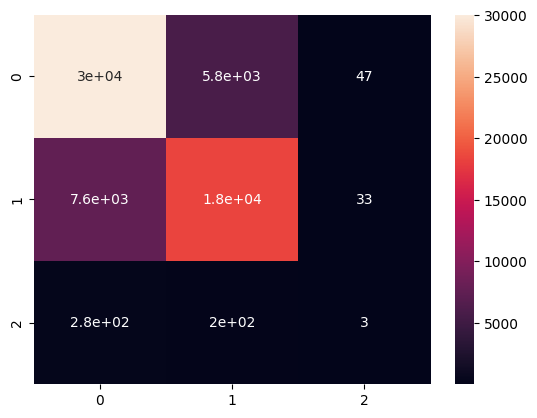

In [144]:
cm = confusion_matrix(predictions_pd.label, predictions_pd.prediction)

sns.heatmap(cm, annot=True)

print(classification_report(predictions_pd.label, predictions_pd.prediction))

# Time-Series


In [112]:
time_data = processedata.select('user_location', 'date', 'text', 'hashtags',
                                'timestamp','year','month','dayofmonth','dayofweek',
                                'dayofyear','week', 'sentiment_label', 'label') \
                                .toDF('user_location', 'date', 'text', 'hashtags',
                                'timestamp','year','month','dayofmonth','dayofweek',
                                'dayofyear','week', 'sentiment_label', 'label')

In [113]:
time_data.show()

23/05/24 02:58:28 WARN DAGScheduler: Broadcasting large task binary with size 8.4 MiB
23/05/24 02:58:28 WARN TaskSetManager: Stage 600 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.


+--------------------+----------+--------------------+--------------------+-------------------+----+-----+----------+---------+---------+----+---------------+-----+
|       user_location|      date|                text|            hashtags|          timestamp|year|month|dayofmonth|dayofweek|dayofyear|week|sentiment_label|label|
+--------------------+----------+--------------------+--------------------+-------------------+----+-----+----------+---------+---------+----+---------------+-----+
|        Barneveld,NY|2021-01-01|@dansmyers @DanAn...|['HappyNewYear202...|2021-01-01 18:51:41|2021|    1|         1|        6|        1|  53|            pos|  0.0|
|Orlando, FL, Unit...|2021-01-01|Trying to get the...|    ['CovidVaccine']|2021-01-01 17:44:31|2021|    1|         1|        6|        1|  53|            pos|  0.0|
|Jammu, Jammu And ...|2021-01-01|COVID-19 vaccine ...|                    |2021-01-01 05:08:16|2021|    1|         1|        6|        1|  53|            pos|  0.0|
|         

In [114]:
daily_sentiment = time_data.groupBy("date", "sentiment_label").agg(
    count("*").alias("count"))
daily_sentiment.show()

23/05/24 02:58:29 WARN DAGScheduler: Broadcasting large task binary with size 8.4 MiB
23/05/24 02:58:29 WARN TaskSetManager: Stage 601 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.


+----------+---------------+-----+
|      date|sentiment_label|count|
+----------+---------------+-----+
|2021-01-08|            pos| 1580|
|2021-01-23|        neutral|   20|
|2021-01-19|            pos| 1289|
|2021-01-13|        neutral|   27|
|2021-01-21|            pos| 1542|
|2021-01-14|            pos| 2491|
|2021-01-09|        neutral|   15|
|2021-01-11|            neg|  659|
|2021-01-25|            pos| 1794|
|2021-01-22|            pos| 1935|
|2021-01-12|            neg| 1034|
|2021-01-15|        neutral|   25|
|2021-01-25|        neutral|   28|
|2021-01-08|        neutral|   24|
|2021-01-19|            neg|  735|
|2021-01-15|            neg| 1002|
|2021-01-24|        neutral|   21|
|2021-01-20|            neg|  918|
|2021-01-10|            neg|  560|
|2021-01-15|            pos| 1733|
+----------+---------------+-----+
only showing top 20 rows



23/05/24 03:02:05 WARN DAGScheduler: Broadcasting large task binary with size 8.2 MiB


In [115]:
daily_sentiment = daily_sentiment.orderBy('date')

In [116]:
daily_sentiment.show()

23/05/24 03:02:06 WARN DAGScheduler: Broadcasting large task binary with size 8.4 MiB
23/05/24 03:02:06 WARN TaskSetManager: Stage 604 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.


+----------+---------------+-----+
|      date|sentiment_label|count|
+----------+---------------+-----+
|2021-01-01|            pos|  946|
|2021-01-01|        neutral|   14|
|2021-01-01|            neg|  761|
|2021-01-08|            neg|  863|
|2021-01-08|        neutral|   24|
|2021-01-08|            pos| 1580|
|2021-01-09|        neutral|   15|
|2021-01-09|            pos| 1275|
|2021-01-09|            neg|  727|
|2021-01-10|            pos|  834|
|2021-01-10|        neutral|    8|
|2021-01-10|            neg|  560|
|2021-01-11|            pos| 1132|
|2021-01-11|            neg|  659|
|2021-01-11|        neutral|   22|
|2021-01-12|            neg| 1034|
|2021-01-12|        neutral|   31|
|2021-01-12|            pos| 1763|
|2021-01-13|            neg| 1336|
|2021-01-13|            pos| 2277|
+----------+---------------+-----+
only showing top 20 rows



23/05/24 03:05:46 WARN DAGScheduler: Broadcasting large task binary with size 8.2 MiB


In [117]:
daily_sentiment_pd = daily_sentiment.toPandas()

23/05/24 03:05:47 WARN DAGScheduler: Broadcasting large task binary with size 8.4 MiB
23/05/24 03:05:47 WARN TaskSetManager: Stage 607 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.
23/05/24 03:09:22 WARN DAGScheduler: Broadcasting large task binary with size 8.2 MiB
23/05/24 03:09:23 WARN DAGScheduler: Broadcasting large task binary with size 8.2 MiB
23/05/24 03:09:24 WARN DAGScheduler: Broadcasting large task binary with size 8.2 MiB


In [154]:
daily_sentiment_pd.head(20)

,date,sentiment_label,count
0,2021-01-01,pos,946
1,2021-01-01,neutral,14
2,2021-01-01,neg,761
3,2021-01-08,pos,1580
4,2021-01-08,neutral,24
5,2021-01-08,neg,863
6,2021-01-09,neutral,15
7,2021-01-09,pos,1275
8,2021-01-09,neg,727
9,2021-01-10,neg,560


In [147]:
fig8 = px.line(daily_sentiment_pd,
               x='date',
               y='count',
               color='sentiment_label',
               title='Sentiment Counts Over 2021')
fig8.show()

In [152]:
time_data_pd = time_data.select(
    [c for c in time_data.columns if c != 'timestamp']).toPandas()

23/05/24 11:36:16 WARN DAGScheduler: Broadcasting large task binary with size 8.4 MiB
23/05/24 11:36:16 WARN TaskSetManager: Stage 696 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.


In [153]:
time_data_pd.head()

,user_location,date,text,hashtags,year,month,dayofmonth,dayofweek,dayofyear,week,sentiment_label,label
0,"Barneveld,NY",2021-01-01,@dansmyers @DanAndShay Getting worse before it...,"['HappyNewYear2021', 'newbeginnings', 'CovidVa...",2021,1,1,6,1,53,pos,0.0
1,"Orlando, FL, United States",2021-01-01,Trying to get the #CovidVaccine in Florida tha...,['CovidVaccine'],2021,1,1,6,1,53,pos,0.0
2,"Jammu, Jammu And Kashmir",2021-01-01,COVID-19 vaccine dry run to be held across Ind...,,2021,1,1,6,1,53,pos,0.0
3,"Houston, TX",2021-01-01,Happy New Year!! Let’s say goodbye to ‘Zoom’ a...,,2021,1,1,6,1,53,pos,0.0
4,The Embassy,2021-01-01,Once that is filled out you get a green check ...,,2021,1,1,6,1,53,pos,0.0


In [228]:
time_data_pd.tail()

,user_location,date,text,hashtags,year,month,dayofmonth,dayofweek,dayofyear,week,sentiment_label,label
310808,,2021-12-30,"Great news #CovidVaccine works, get the vaccin...",['CovidVaccine'],2021,12,30,5,364,52,pos,0.0
310809,"Connecticut, USA",2021-12-30,#COVID19 #COVIDVaccine\n\nI reported this Ian ...,"['COVID19', 'COVIDVaccine']",2021,12,30,5,364,52,neg,1.0
310810,"Los Angeles, CA",2021-12-30,Are people still getting #CovidVaccine ?\n\nOr...,"['CovidVaccine', 'CovidTesting']",2021,12,30,5,364,52,pos,0.0
310811,"Greater Manchester, UK",2021-12-30,📢Walk-in #CovidVaccine clinic TODAY (30 Decemb...,"['CovidVaccine', 'GetBoostedNow']",2021,12,30,5,364,52,pos,0.0
310812,"Bengaluru, India",2021-12-30,18-44 #BBMP #Bengaluru #CovidVaccine Availabil...,"['BBMP', 'Bengaluru', 'CovidVaccine', 'COVISHI...",2021,12,30,5,364,52,pos,0.0


In [155]:
daily_sentiment_pd.dtypes

date               object
sentiment_label    object
count               int64
dtype: object

In [158]:
daily_sentiment_pd['date'] = pd.to_datetime(daily_sentiment_pd['date'])

In [160]:
daily_sentiment_pd.dtypes

date               datetime64[ns]
sentiment_label            object
count                       int64
dtype: object

In [161]:
daily_sentiment_pd.head()

,date,sentiment_label,count
0,2021-01-01,pos,946
1,2021-01-01,neutral,14
2,2021-01-01,neg,761
3,2021-01-08,pos,1580
4,2021-01-08,neutral,24


In [164]:
daily_sentiment_pd['year'] = daily_sentiment_pd.date.dt.year
daily_sentiment_pd['month'] = daily_sentiment_pd.date.dt.month
daily_sentiment_pd['day'] = daily_sentiment_pd.date.dt.day
daily_sentiment_pd['dayofyear'] = daily_sentiment_pd.date.dt.dayofyear
daily_sentiment_pd['quarter'] = daily_sentiment_pd.date.dt.quarter

In [175]:
daily_sentiment_pd.head(1000)

,date,sentiment_label,count,year,month,day,dayofyear,quarter
0,2021-01-01,pos,946,2021,1,1,1,1
1,2021-01-01,neutral,14,2021,1,1,1,1
2,2021-01-01,neg,761,2021,1,1,1,1
3,2021-01-08,pos,1580,2021,1,8,8,1
4,2021-01-08,neutral,24,2021,1,8,8,1
...,...,...,...,...,...,...,...,...
629,2021-12-29,pos,316,2021,12,29,363,4
630,2021-12-29,neutral,3,2021,12,29,363,4
631,2021-12-30,neutral,2,2021,12,30,364,4
632,2021-12-30,neg,264,2021,12,30,364,4


In [166]:
daily_sentiment_pd.tail()

,date,sentiment_label,count,year,month,day,dayofyear,quarter
629,2021-12-29,pos,316,2021,12,29,363,4
630,2021-12-29,neutral,3,2021,12,29,363,4
631,2021-12-30,neutral,2,2021,12,30,364,4
632,2021-12-30,neg,264,2021,12,30,364,4
633,2021-12-30,pos,348,2021,12,30,364,4


In [172]:
daily_sentiment_pd.sentiment_label.describe()

count     634
unique      3
top       pos
freq      212
Name: sentiment_label, dtype: object

In [191]:
pipeline3 = Pipeline() \
     .setStages([
           documentAssembler,
           tokenizer,
           normalizer,
           lemmatizer,
           stopwords_cleaner,
           finisher1,
           tfidf,
           idf,
           embeddings,
           sentiment_analysis
     ])

In [231]:
processedata_time_sent = pipeline3.fit(data).transform(data)

23/05/24 13:45:10 WARN TaskSetManager: Stage 714 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.
23/05/24 13:46:32 WARN DAGScheduler: Broadcasting large task binary with size 4.2 MiB
23/05/24 13:46:33 WARN TaskSetManager: Stage 718 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.
23/05/24 13:47:48 WARN DAGScheduler: Broadcasting large task binary with size 4.2 MiB


In [221]:
sent_scores = processedata_time_sent.select("sentiment.metadata").collect()

23/05/24 13:30:49 WARN DAGScheduler: Broadcasting large task binary with size 8.4 MiB
23/05/24 13:30:50 WARN TaskSetManager: Stage 713 contains a task of very large size (8790 KiB). The maximum recommended task size is 1000 KiB.


In [234]:
sent_scores

[Row(metadata=[{'sentence': '0', 'pos': '0.960285', 'neg': '0.03971502'}]),
 Row(metadata=[{'sentence': '0', 'pos': '0.9956436', 'neg': '0.004356343'}]),
 Row(metadata=[{'sentence': '0', 'pos': '0.99999976', 'neg': '2.1081453E-7'}]),
 Row(metadata=[{'sentence': '0', 'pos': '1.0', 'neg': '2.7523652E-19'}]),
 Row(metadata=[{'sentence': '0', 'pos': '0.9999981', 'neg': '1.8976028E-6'}]),
 Row(metadata=[{'sentence': '0', 'pos': '1.0', 'neg': '2.298119E-10'}]),
 Row(metadata=[{'sentence': '0', 'pos': '1.0', 'neg': '3.7451722E-10'}]),
 Row(metadata=[{'sentence': '0', 'pos': '1.10237215E-5', 'neg': '0.99998903'}]),
 Row(metadata=[{'sentence': '0', 'pos': '0.99991345', 'neg': '8.648083E-5'}]),
 Row(metadata=[{'sentence': '0', 'pos': '0.99999976', 'neg': '2.3509787E-7'}]),
 Row(metadata=[{'sentence': '0', 'pos': '4.7980505E-13', 'neg': '1.0'}]),
 Row(metadata=[{'sentence': '0', 'pos': '3.5606273E-9', 'neg': '1.0'}]),
 Row(metadata=[{'sentence': '0', 'pos': '8.1907815E-13', 'neg': '1.0'}]),
 Row(

In [235]:
scores = []

# Extract scores from the list
for row in sent_scores:
    metadata = row.metadata[0]
    scores.append({
        'pos': float(metadata['pos']),
        'neg': float(metadata['neg'])
    })

# Create a pandas DataFrame from the scores list
df = pd.DataFrame(scores)

# Print the DataFrame
print(df)

                 pos           neg
0       9.602850e-01  3.971502e-02
1       9.956436e-01  4.356343e-03
2       9.999998e-01  2.108145e-07
3       1.000000e+00  2.752365e-19
4       9.999981e-01  1.897603e-06
...              ...           ...
310808  1.000000e+00  7.608253e-12
310809  4.845415e-16  1.000000e+00
310810  9.993581e-01  6.418729e-04
310811  1.000000e+00  1.005227e-11
310812  1.000000e+00  5.842673e-11

[310813 rows x 2 columns]


In [237]:
df.tail(10)

,pos,neg
310803,9.482521e-01,5.174793e-02
310804,1.000000e+00,2.169618e-16
310805,1.000000e+00,8.047999e-13
310806,1.445621e-04,9.998554e-01
310807,9.999989e-01,1.099082e-06
310808,1.000000e+00,7.608253e-12
310809,4.845415e-16,1.000000e+00
310810,9.993581e-01,6.418729e-04
310811,1.000000e+00,1.005227e-11
310812,1.000000e+00,5.842673e-11


In [244]:
time_data_pd = time_data_pd.join(df)

In [246]:
time_data_pd.sample(10)

,user_location,date,text,hashtags,year,month,dayofmonth,dayofweek,dayofyear,week,sentiment_label,label,pos,neg
102864,Ireland,2021-02-19,Mike Ryan is 100% right on this - we need to p...,['COVIDVaccine'],2021,2,19,6,50,7,pos,0.0,1.000000,2.610842e-08
203905,"Contra Costa County, CA",2021-07-13,Everyone age 12+ can get a free #COVIDVaccine....,['COVIDVaccine'],2021,7,13,3,194,28,pos,0.0,1.000000,9.682361e-11
155501,,2021-04-09,"1 shot down, 1 more to go. #CovidVaccine",['CovidVaccine'],2021,4,9,6,99,14,neg,1.0,0.000416,9.995843e-01
188850,,2021-06-22,"Over 85.15 lakh #CovidVaccine doses, the highe...","['CovidVaccine', 'COVID19Vaccination']",2021,6,22,3,173,25,pos,0.0,0.999998,2.287276e-06
80946,"Santa Clara, CA",2021-02-09,South Africa Defers @AstraZeneca Vaccinations ...,,2021,2,9,3,40,6,pos,0.0,1.000000,2.538622e-08
153290,,2021-04-09,13 Rite Aids show #CovidVaccine slots in VA:\n...,['CovidVaccine'],2021,4,9,6,99,14,pos,0.0,0.999453,5.469853e-04
70681,Woodlands | Portland | Austin,2021-02-04,#CovidVaccine Or when you've had #covid and y...,"['CovidVaccine', 'covid']",2021,2,4,5,35,5,pos,0.0,1.000000,6.916699e-12
157081,,2021-04-10,#CovidVaccine\nIndia to restart Covid vaccine ...,['CovidVaccine'],2021,4,10,7,100,14,pos,0.0,1.000000,9.323142e-12
82616,"Tampa, FL",2021-02-09,"So proud of my daughter-in-law Lindsay, one of...",,2021,2,9,3,40,6,pos,0.0,1.000000,1.531368e-10
185994,"London, England",2021-06-18,"""It's a no brainer for me – it gives full prot...",['COVIDVaccine'],2021,6,18,6,169,24,pos,0.0,1.000000,1.236350e-09


In [251]:
time_data_pd[['pos', 'neg']].describe()

,pos,neg
count,3.108130e+05,3.108130e+05
mean,5.814317e-01,4.185683e-01
std,4.836858e-01,4.836858e-01
min,6.986780e-29,1.845026e-34
25%,1.404873e-06,1.049144e-09
50%,9.995799e-01,4.201066e-04
75%,1.000000e+00,9.999986e-01
max,1.000000e+00,1.000000e+00


In [302]:
print(daily_scores)

           date       pos       neg
0    2021-01-01  0.554427  0.445573
1    2021-01-08  0.643175  0.356825
2    2021-01-09  0.635743  0.364257
3    2021-01-10  0.594935  0.405065
4    2021-01-11  0.631326  0.368674
..          ...       ...       ...
207  2021-12-26  0.565941  0.434059
208  2021-12-27  0.637896  0.362104
209  2021-12-28  0.599387  0.400613
210  2021-12-29  0.581525  0.418475
211  2021-12-30  0.567429  0.432571

[212 rows x 3 columns]


In [274]:
daily_scores = time_data_pd.groupby('date').agg({
    'pos': 'mean',
    'neg': 'mean'
}).reset_index()

In [276]:
daily_scores.head()

,date,pos,neg
0,2021-01-01,0.554427,0.445573
1,2021-01-08,0.643175,0.356825
2,2021-01-09,0.635743,0.364257
3,2021-01-10,0.594935,0.405065
4,2021-01-11,0.631326,0.368674


In [277]:
daily_scores.tail()

,date,pos,neg
207,2021-12-26,0.565941,0.434059
208,2021-12-27,0.637896,0.362104
209,2021-12-28,0.599387,0.400613
210,2021-12-29,0.581525,0.418475
211,2021-12-30,0.567429,0.432571


In [365]:
fig9 = go.Figure()
fig9.add_trace(
    go.Scatter(x=daily_scores['date'],
               y=daily_scores['pos'],
               name='Positive Scores'))

# Add a line plot for negative scores
fig9.add_trace(
    go.Scatter(x=daily_scores['date'],
               y=daily_scores['neg'],
               name='Negative Scores'))

# Update the layout of the plot
fig9.update_layout(
    title='Mean Positive and Negative Scores Over Time on a Daily Basis 2021',
    xaxis_title='Date',
    yaxis_title='Mean Score')

# Show the plot
fig9.show()

In [280]:
monthly_scores = time_data_pd.groupby('month').agg({
    'pos': 'mean',
    'neg': 'mean'
}).reset_index()

In [282]:
monthly_scores.head(20)

,month,pos,neg
0,1,0.606442,0.393558
1,2,0.611519,0.388481
2,3,0.636312,0.363688
3,4,0.619038,0.380962
4,5,0.583579,0.416421
5,6,0.599364,0.400636
6,7,0.516716,0.483284
7,8,0.495727,0.504273
8,9,0.551010,0.448990
9,10,0.565587,0.434413


In [288]:
fig10 = go.Figure()
fig10.add_trace(
    go.Scatter(
        x=monthly_scores['month'].apply(lambda x: calendar.month_name[x]),
        y=monthly_scores['pos'],
        name='Positive Scores'))

# Add a line plot for negative scores
fig10.add_trace(
    go.Scatter(
        x=monthly_scores['month'].apply(lambda x: calendar.month_name[x]),
        y=monthly_scores['neg'],
        name='Negative Scores'))

# Update the layout of the plot
fig10.update_layout(
    title='Mean Positive and Negative Scores Over Time on a Monthly Basis',
    xaxis_title='Month',
    yaxis_title='Mean Score')

# Show the plot
fig10.show()

In [291]:
time_data_pd['date'] = pd.to_datetime(time_data_pd['date'])
time_data_pd['quarter'] = time_data_pd.date.dt.quarter

In [293]:
time_data_pd.sample(10)

,user_location,date,text,hashtags,year,month,dayofmonth,dayofweek,dayofyear,week,sentiment_label,label,pos,neg,quarter
168029,"Wheeler, Illinois",2021-04-27,Finally got the first shot of the #Moderna #Co...,"['Moderna', 'CovidVaccine', 'VOCALOID']",2021,4,27,3,117,17,pos,0.0,1.000000e+00,1.630197e-15,2
68569,"Leatherhead, Surrey",2021-02-03,"""The increasing level of violence they face, e...",,2021,2,3,4,34,5,neg,1.0,2.063977e-03,9.979360e-01,1
189416,Canada,2021-06-22,@inky_mark Do we need a new vaccine yet?? Mayb...,"['covidvaccine', 'NextWave', 'NewPandemic', 'H...",2021,6,22,3,173,25,neg,1.0,5.731518e-09,1.000000e+00,2
264331,"Bengaluru, India",2021-10-17,18-44 #BBMP #Bengaluru #CovidVaccine Availabil...,"['BBMP', 'Bengaluru', 'CovidVaccine', 'COVISHI...",2021,10,17,1,290,41,pos,0.0,1.000000e+00,5.822473e-10,4
76968,"Port Townsend, WA",2021-02-07,Finding Your Immunity from Disease https://t.c...,"['Christian', 'business', 'healing', 'Prayer']",2021,2,7,1,38,5,neg,1.0,9.030802e-08,9.999999e-01,1
115095,,2021-02-26,"Prof. Anthony Harnden, a practicing GP and dep...",,2021,2,26,6,57,8,neg,1.0,1.969396e-02,9.803060e-01,1
100028,"Hebden Bridge, England",2021-02-18,Feeling very thankful (and weirdly guilty) to ...,,2021,2,18,5,49,7,pos,0.0,9.999901e-01,9.864672e-06,1
215290,"Belfast, Northern Ireland",2021-07-22,Racist wanker Eric Clapton has no issue taking...,"['Covid19UK', 'CovidVaccine', 'COVIDIOTS']",2021,7,22,5,203,29,neg,1.0,2.343440e-07,9.999998e-01,3
220290,Australia,2021-07-26,"50 symptoms, 15 specialists, 8 scans, 3 trips ...","['LongCovid', 'CovidVaccine', 'Covid_19']",2021,7,26,2,207,30,neg,1.0,2.178131e-11,1.000000e+00,3
110305,"Leeds, UK; Longford, Ireland",2021-02-24,I wish other #breastfeeding mothers the relief...,"['breastfeeding', 'covidvaccine']",2021,2,24,4,55,8,pos,0.0,1.000000e+00,4.199293e-10,1


In [294]:
quarter_scores = time_data_pd.groupby('quarter').agg({
    'pos': 'mean',
    'neg': 'mean'
}).reset_index()

In [295]:
quarter_scores.head()

,quarter,pos,neg
0,1,0.614283,0.385717
1,2,0.605401,0.394599
2,3,0.507628,0.492372
3,4,0.566684,0.433316


In [300]:
fig11 = go.Figure()
fig11.add_trace(
    go.Scatter(x=quarter_scores['quarter'],
               y=quarter_scores['pos'],
               name='Positive Scores'))

# Add a line plot for negative scores
fig11.add_trace(
    go.Scatter(x=quarter_scores['quarter'],
               y=quarter_scores['neg'],
               name='Negative Scores'))

# Update the layout of the plot
fig11.update_layout(
    title='Mean Positive and Negative Scores Over Time Per Quarter',
    xaxis_title='Month',
    yaxis_title='Mean Score')

# Show the plot
fig11.show()

In [305]:
daily_scores.head()

,date,pos,neg
0,2021-01-01,0.554427,0.445573
1,2021-01-08,0.643175,0.356825
2,2021-01-09,0.635743,0.364257
3,2021-01-10,0.594935,0.405065
4,2021-01-11,0.631326,0.368674


In [306]:
daily_scores_pos = daily_scores[['date', 'pos']]

In [309]:
daily_scores_pos.tail()

,date,pos
207,2021-12-26,0.565941
208,2021-12-27,0.637896
209,2021-12-28,0.599387
210,2021-12-29,0.581525
211,2021-12-30,0.567429


In [312]:
daily_scores_pos = daily_scores_pos.rename(columns={'date': 'ds', 'pos': 'y'})

In [636]:
param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01,0.05, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    forecastmodel_pos = Prophet(**params).fit(daily_scores_pos)  # Fit model with given params
    df_cv = cross_validation(forecastmodel_pos, horizon='30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

21:28:31 - cmdstanpy - INFO - Chain [1] start processing
21:28:31 - cmdstanpy - INFO - Chain [1] done processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] done processing
21:28:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Communication error on send
Optimization terminated abnormally. Falling back to Newton.
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] done processing
21:28:32 - cmdstanpy - INFO - Chain [1] done processing
21:28:32 - cmdstanpy - INFO - Chain [1] done p

21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] done processing
21:28:39 - cmdstanpy - INFO - Chain [1] done processing
21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] done processing
21:28:39 - cmdstanpy - INFO - Chain [1] done processing
21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] done processing
21:28:39 - cmdstanpy - INFO - Chain [1] done processing
21:28:40 - cmdstanpy - INFO - Chain [1] done processing
21:28:40 - cmdstanpy - INFO - Chain [1] done processing
21:28:40 - cmdstanpy - INFO - Chain [1] start processing
21:28:40 - cmdstanpy - INFO - Chain [1] done processing
21:28:40 - cmdstanpy - INFO - Chain [1] done processing
21:28:40 - cmdstanpy - ERROR - Chain [1] error: error during processing Communication error on send
Optimization terminated abnormally. Falling back to New

21:28:49 - cmdstanpy - INFO - Chain [1] done processing
21:28:49 - cmdstanpy - INFO - Chain [1] start processing
21:28:49 - cmdstanpy - INFO - Chain [1] done processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] done processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] start processing
21:28:50 - cmdstanpy - INFO - Chain [1] done processing
21:28:51 - cmdstanpy - INFO - Chain [1] start processing
21:28:51 - cmdstanpy - INFO - Chain [1] done processing
21:28:51 - cmdstanpy - INFO - Chain [1] done processing
21:28:51 - cmdstanpy - INFO - Chain [

21:28:59 - cmdstanpy - INFO - Chain [1] done processing
21:28:59 - cmdstanpy - INFO - Chain [1] done processing
21:29:00 - cmdstanpy - INFO - Chain [1] start processing
21:29:00 - cmdstanpy - INFO - Chain [1] done processing
21:29:00 - cmdstanpy - INFO - Chain [1] start processing
21:29:00 - cmdstanpy - INFO - Chain [1] start processing
21:29:00 - cmdstanpy - INFO - Chain [1] start processing
21:29:00 - cmdstanpy - INFO - Chain [1] start processing
21:29:01 - cmdstanpy - INFO - Chain [1] start processing
21:29:01 - cmdstanpy - INFO - Chain [1] start processing
21:29:01 - cmdstanpy - INFO - Chain [1] start processing
21:29:01 - cmdstanpy - INFO - Chain [1] start processing
21:29:01 - cmdstanpy - INFO - Chain [1] done processing
21:29:01 - cmdstanpy - INFO - Chain [1] start processing
21:29:01 - cmdstanpy - INFO - Chain [1] done processing
21:29:01 - cmdstanpy - INFO - Chain [1] done processing
21:29:01 - cmdstanpy - INFO - Chain [1] done processing
21:29:01 - cmdstanpy - INFO - Chain [1

21:29:11 - cmdstanpy - INFO - Chain [1] start processing
21:29:11 - cmdstanpy - INFO - Chain [1] done processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] done processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:13 - cmdstanpy - INFO - Chain [1] start processing
21:29:13 - cmdstanpy - INFO - Chain [1] done processing
21:29:13 - cmdstanpy - INFO - Chain [1] done processing
21:29:13 - cmdstanpy - INFO - Chain [1] done processing
21:29:13 - cmdstanpy - INFO - Chain [1] done processing
21:29:13 - cmdstanpy - INFO - Chain [1] done processing
21:29:13 - cmdstanpy - INFO - Chain [1

21:29:25 - cmdstanpy - INFO - Chain [1] done processing
21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] start processing
21:29:26 - cmdstanpy - INFO - Chain [1] done processing
21:29:27 - cmdstanpy - INFO - Chain [1] start processing
21:29:27 - cmdstanpy - INFO - Chain [1] done processing
21:29:27 - cmdstanpy - INFO - Chain [1] done processing
21:29:27 - cmdstanpy - INFO - Chain [1] start processing
21:29:27 - cmdstanpy - INFO - Chain [1] done processing
21:29:27 - cmdstanpy - INFO - Chain [1] done processing
21:29:27 - cmdstanpy - INFO - Chain [1] done processing
21:29:27 - cmdstanpy - INFO - Chain [1

    changepoint_prior_scale  seasonality_prior_scale      rmse
0                     0.001                     0.01  0.070608
1                     0.001                     0.10  0.070489
2                     0.001                     1.00  0.071480
3                     0.001                    10.00  0.071056
4                     0.010                     0.01  0.080294
5                     0.010                     0.10  0.080798
6                     0.010                     1.00  0.081070
7                     0.010                    10.00  0.081359
8                     0.050                     0.01  0.079496
9                     0.050                     0.10  0.080976
10                    0.050                     1.00  0.080706
11                    0.050                    10.00  0.080620
12                    0.100                     0.01  0.071947
13                    0.100                     0.10  0.071594
14                    0.100                     1.00  0

In [637]:
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.1}


In [638]:
forecastmodel_pos = Prophet(changepoint_prior_scale=0.5, seasonality_prior_scale=0.1)

In [639]:
forecastmodel_pos.fit(daily_scores_pos)

21:30:44 - cmdstanpy - INFO - Chain [1] start processing
21:30:44 - cmdstanpy - INFO - Chain [1] done processing


In [640]:
pos_future = forecastmodel_pos.make_future_dataframe(periods=365)
pos_future.tail()

,ds
572,2022-12-26
573,2022-12-27
574,2022-12-28
575,2022-12-29
576,2022-12-30


In [641]:
forecast_pos = forecastmodel_pos.predict(pos_future)
forecast_pos[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
572,2022-12-26,0.733995,-0.056390,1.438742
573,2022-12-27,0.737450,-0.063905,1.421620
574,2022-12-28,0.732587,-0.057647,1.441870
575,2022-12-29,0.732734,-0.077468,1.440166
576,2022-12-30,0.741096,-0.059886,1.441858


In [742]:
fig12 = plot_plotly(
    forecastmodel_pos,
    forecast_pos).update_layout(title='Positive Sentiment Forecast 1 year')

fig12.show()

In [643]:
daily_scores_neg = daily_scores[['date', 'neg']]

In [644]:
daily_scores_neg.tail()

,date,neg
207,2021-12-26,0.434059
208,2021-12-27,0.362104
209,2021-12-28,0.400613
210,2021-12-29,0.418475
211,2021-12-30,0.432571


In [645]:
daily_scores_neg = daily_scores_neg.rename(columns={'date': 'ds', 'neg': 'y'})

In [646]:
forecastmodel_neg = Prophet(changepoint_prior_scale=0.5, seasonality_prior_scale=0.1)

In [647]:
forecastmodel_neg.fit(daily_scores_neg)

21:31:50 - cmdstanpy - INFO - Chain [1] start processing
21:31:50 - cmdstanpy - INFO - Chain [1] done processing


In [648]:
neg_future = forecastmodel_neg.make_future_dataframe(periods=365)
neg_future.tail()

,ds
572,2022-12-26
573,2022-12-27
574,2022-12-28
575,2022-12-29
576,2022-12-30


In [649]:
forecast_neg = forecastmodel_neg.predict(neg_future)
forecast_neg[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
572,2022-12-26,0.249261,-0.251281,0.776420
573,2022-12-27,0.245794,-0.263232,0.794454
574,2022-12-28,0.250389,-0.258512,0.789302
575,2022-12-29,0.250209,-0.265079,0.793439
576,2022-12-30,0.241497,-0.281520,0.781044


In [650]:
fig13 = plot_plotly(
    forecastmodel_neg,
    forecast_neg).update_layout(title='Negative Sentiment Forecast 1 year')
fig13.show()

In [651]:
pos_futureweek = forecastmodel_pos.make_future_dataframe(periods=7)
pos_futureweek.tail()

,ds
214,2022-01-02
215,2022-01-03
216,2022-01-04
217,2022-01-05
218,2022-01-06


In [652]:
forecast_pos_week = forecastmodel_pos.predict(pos_futureweek)
forecast_pos_week[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(8)

,ds,yhat,yhat_lower,yhat_upper
211,2021-12-30,0.586473,0.537351,0.641066
212,2021-12-31,0.594836,0.543939,0.646726
213,2022-01-01,0.610478,0.559660,0.666556
214,2022-01-02,0.567359,0.514836,0.620998
215,2022-01-03,0.590547,0.537605,0.640579
216,2022-01-04,0.594002,0.536063,0.642535
217,2022-01-05,0.589139,0.538669,0.639721
218,2022-01-06,0.589286,0.534676,0.641065


In [653]:
fig13 = plot_plotly(forecastmodel_pos, forecast_pos_week).update_layout(
    title='Positive Sentiment Forecast 1 week')

fig13.show()

In [654]:
neg_futureweek = forecastmodel_neg.make_future_dataframe(periods=7)
neg_futureweek.tail()

,ds
214,2022-01-02
215,2022-01-03
216,2022-01-04
217,2022-01-05
218,2022-01-06


In [655]:
forecast_neg_week = forecastmodel_neg.predict(neg_futureweek)
forecast_neg_week[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(8)

,ds,yhat,yhat_lower,yhat_upper
211,2021-12-30,0.412217,0.358157,0.465165
212,2021-12-31,0.403505,0.351058,0.455768
213,2022-01-01,0.388203,0.338240,0.439581
214,2022-01-02,0.431156,0.380482,0.482642
215,2022-01-03,0.408153,0.353598,0.457393
216,2022-01-04,0.404686,0.348271,0.456475
217,2022-01-05,0.409281,0.358713,0.463528
218,2022-01-06,0.409101,0.355336,0.462080


In [657]:
fig14 = plot_plotly(forecastmodel_neg, forecast_neg_week).update_layout(
    title='Negative Sentiment Forecast 1 week')

fig14.show()

In [658]:
pos_futuremonth = forecastmodel_pos.make_future_dataframe(periods=32)
pos_futuremonth.tail()

,ds
239,2022-01-27
240,2022-01-28
241,2022-01-29
242,2022-01-30
243,2022-01-31


In [659]:
forecast_pos_month = forecastmodel_pos.predict(pos_futuremonth)
forecast_pos_month[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(8)

,ds,yhat,yhat_lower,yhat_upper
236,2022-01-24,0.598985,0.543193,0.650490
237,2022-01-25,0.602441,0.550205,0.655303
238,2022-01-26,0.597577,0.542496,0.651473
239,2022-01-27,0.597724,0.543424,0.654019
240,2022-01-28,0.606086,0.551577,0.660789
241,2022-01-29,0.621729,0.570111,0.679087
242,2022-01-30,0.578609,0.523474,0.630102
243,2022-01-31,0.601798,0.544304,0.658234


In [660]:
fig15 = plot_plotly(forecastmodel_pos, forecast_pos_month).update_layout(
    title='Positive Sentiment Forecast 1 month')

fig15.show()

In [661]:
neg_futuremonth = forecastmodel_neg.make_future_dataframe(periods=31)
neg_futuremonth.tail()

,ds
238,2022-01-26
239,2022-01-27
240,2022-01-28
241,2022-01-29
242,2022-01-30


In [662]:
forecast_neg_month = forecastmodel_neg.predict(neg_futuremonth)
forecast_neg_month[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(8)

,ds,yhat,yhat_lower,yhat_upper
235,2022-01-23,0.421810,0.366361,0.473427
236,2022-01-24,0.398806,0.341028,0.450564
237,2022-01-25,0.395339,0.340469,0.448973
238,2022-01-26,0.399935,0.347016,0.455217
239,2022-01-27,0.399754,0.345157,0.452541
240,2022-01-28,0.391043,0.336409,0.445888
241,2022-01-29,0.375741,0.321338,0.428153
242,2022-01-30,0.418694,0.360380,0.471668


In [663]:
fig15 = plot_plotly(forecastmodel_neg, forecast_neg_month).update_layout(
    title='Negative Sentiment Forecast 1 month')

fig15.show()

In [664]:
pos_future90 = forecastmodel_pos.make_future_dataframe(periods=91)
pos_future90.tail()

,ds
298,2022-03-27
299,2022-03-28
300,2022-03-29
301,2022-03-30
302,2022-03-31


In [665]:
forecast_pos_90 = forecastmodel_pos.predict(pos_future90)
forecast_pos_90[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(8)

,ds,yhat,yhat_lower,yhat_upper
295,2022-03-24,0.620226,0.521496,0.722229
296,2022-03-25,0.628588,0.524507,0.724258
297,2022-03-26,0.644230,0.526881,0.741239
298,2022-03-27,0.601111,0.494966,0.699944
299,2022-03-28,0.624299,0.515536,0.724200
300,2022-03-29,0.627755,0.514783,0.737555
301,2022-03-30,0.622891,0.509898,0.732857
302,2022-03-31,0.623039,0.507147,0.729066


In [666]:
fig16 = plot_plotly(forecastmodel_pos, forecast_pos_90).update_layout(
    title='Positive Sentiment Forecast 3 months')

fig16.show()

In [667]:
neg_future90 = forecastmodel_neg.make_future_dataframe(periods=91)
neg_future90.tail()

,ds
298,2022-03-27
299,2022-03-28
300,2022-03-29
301,2022-03-30
302,2022-03-31


In [668]:
forecast_neg_90 = forecastmodel_neg.predict(neg_future90)
forecast_neg_90[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(8)

,ds,yhat,yhat_lower,yhat_upper
295,2022-03-24,0.374830,0.300590,0.452666
296,2022-03-25,0.366118,0.288287,0.445923
297,2022-03-26,0.350817,0.273241,0.426329
298,2022-03-27,0.393770,0.316532,0.472106
299,2022-03-28,0.370766,0.289699,0.454147
300,2022-03-29,0.367300,0.288006,0.448028
301,2022-03-30,0.371895,0.290058,0.453614
302,2022-03-31,0.371715,0.291365,0.458513


In [669]:
fig17 = plot_plotly(forecastmodel_neg, forecast_neg_90).update_layout(
    title='Negative Sentiment Forecast 3 months')

fig17.show()

In [670]:
tweets_spark.createOrReplaceTempView("tweets")

In [671]:
tweets_spark_2022 = spark.createDataFrame(
    spark.sql("SELECT * FROM tweets WHERE year = 2022").collect())

In [672]:
data2022 = tweets_spark_2022.select('user_location', 'date', 'text', 'hashtags',
                                'timestamp','year','month','dayofmonth','dayofweek',
                                'dayofyear','week') \
                                .toDF('user_location', 'date', 'text', 'hashtags',
                                'timestamp','year','month','dayofmonth','dayofweek',
                                'dayofyear','week')

In [673]:
data2022.show()

+--------------------+----------+--------------------+--------------------+-------------------+----+-----+----------+---------+---------+----+
|       user_location|      date|                text|            hashtags|          timestamp|year|month|dayofmonth|dayofweek|dayofyear|week|
+--------------------+----------+--------------------+--------------------+-------------------+----+-----+----------+---------+---------+----+
|Penistone, South ...|2022-01-06|Just had my #COVI...|['COVIDBooster', ...|2022-01-06 13:47:48|2022|    1|         6|        5|        6|   1|
|      Ottawa, Canada|2022-01-06|The last day of t...|['Indigenous', 'O...|2022-01-06 14:45:24|2022|    1|         6|        5|        6|   1|
|If I agree I will...|2022-01-06|#OmicronVirus\n#T...|['OmicronVirus', ...|2022-01-06 14:27:06|2022|    1|         6|        5|        6|   1|
|       United States|2022-01-06|“CDC Expands Boos...|['COVID19', 'covi...|2022-01-06 19:26:00|2022|    1|         6|        5|        6|   1|

23/05/24 21:34:53 WARN TaskSetManager: Stage 753 contains a task of very large size (2037 KiB). The maximum recommended task size is 1000 KiB.


In [674]:
processedata_time_sent2022 = pipeline3.fit(data2022).transform(data2022)

23/05/24 21:34:57 WARN TaskSetManager: Stage 754 contains a task of very large size (2037 KiB). The maximum recommended task size is 1000 KiB.
23/05/24 21:35:12 WARN DAGScheduler: Broadcasting large task binary with size 1268.4 KiB
23/05/24 21:35:12 WARN TaskSetManager: Stage 758 contains a task of very large size (2037 KiB). The maximum recommended task size is 1000 KiB.
23/05/24 21:35:26 WARN DAGScheduler: Broadcasting large task binary with size 1269.4 KiB


In [675]:
sent_scores2022 = processedata_time_sent2022.select(
    "sentiment.metadata").collect()

23/05/24 21:35:31 WARN DAGScheduler: Broadcasting large task binary with size 2.6 MiB
23/05/24 21:35:31 WARN TaskSetManager: Stage 760 contains a task of very large size (2037 KiB). The maximum recommended task size is 1000 KiB.


In [676]:
scores = []

# Extract scores from the list
for row in sent_scores2022:
    metadata = row.metadata[0]
    scores.append({
        'pos': float(metadata['pos']),
        'neg': float(metadata['neg'])
    })

# Create a pandas DataFrame from the scores list
df = pd.DataFrame(scores)

# Print the DataFrame
print(df)

                pos           neg
0      3.413283e-07  9.999996e-01
1      1.000000e+00  1.418237e-12
2      9.999338e-01  6.614354e-05
3      9.047802e-08  9.999999e-01
4      4.564802e-02  9.543520e-01
...             ...           ...
52020  2.525195e-04  9.997475e-01
52021  1.000000e+00  4.012872e-08
52022  2.770079e-02  9.722992e-01
52023  1.308909e-07  9.999999e-01
52024  9.999991e-01  9.782016e-07

[52025 rows x 2 columns]


In [677]:
time_data_pd_2022 = data2022.select(
    [c for c in data2022.columns if c != 'timestamp']).toPandas()

23/05/24 21:36:18 WARN TaskSetManager: Stage 761 contains a task of very large size (2037 KiB). The maximum recommended task size is 1000 KiB.


In [678]:
time_data_pd_2022 = time_data_pd_2022.join(df)

In [679]:
time_data_pd_2022.sample(10)

,user_location,date,text,hashtags,year,month,dayofmonth,dayofweek,dayofyear,week,pos,neg
14720,"Greenville, NC",2022-01-27,There is NO evidence that ivermectin works to ...,"['COVID19', 'Covid', 'CovidVaccine', 'CoronaUp...",2022,1,27,5,27,4,1.357606e-03,9.986424e-01
19522,,2022-02-07,@ajthompson13 #CovidVaccine #COVIDisAirborne #...,"['CovidVaccine', 'COVIDisAirborne', 'COVID']",2022,2,7,2,38,6,1.326222e-09,1.000000e+00
13997,"Issaquah, WA",2022-01-25,Got Boosted! #CovidVaccine #BoosterDose,"['CovidVaccine', 'BoosterDose']",2022,1,25,3,25,4,9.999988e-01,1.242153e-06
18641,Amsterdam,2022-02-05,"Yes , governments do manipulate us . Yes, phar...","['Covid', 'COVIDisAirbornePH', 'COVIDIOT', 'CO...",2022,2,5,7,36,5,9.999955e-01,4.538515e-06
15938,"Toronto, Ontario",2022-01-29,Hot tip: When dealing with #antivaxxers online...,"['antivaxxers', 'CovidVaccine', 'FreedomConvoy...",2022,1,29,7,29,4,2.561592e-13,1.000000e+00
25530,Bareilly,2022-02-25,@firuzimehta @awakenindiamvmt @SameerD41 You a...,['CovidVaccine'],2022,2,25,6,56,8,1.000000e+00,6.260053e-11
39427,pune,2022-05-10,"Even Mild COVID Can Do This To Your Brain, Exp...","['coronavirussymptoms', 'longcovid', 'coronavi...",2022,5,10,3,130,19,1.612314e-08,1.000000e+00
38760,"Bengaluru, India",2022-05-08,45+ #BBMP #Bengaluru #CovidVaccine Availabilit...,"['BBMP', 'Bengaluru', 'CovidVaccine']",2022,5,8,1,128,18,1.000000e+00,3.431834e-12
27220,Pretoria,2022-03-08,@PhophiRamathuba you were very loud when vacci...,"['Pfizer', 'VaccineSideEffects', 'CovidVaccine...",2022,3,8,3,67,10,1.326487e-18,1.000000e+00
21790,,2022-02-13,Remember this when you hear people talk about ...,"['CovidVaccine', 'WearAMask']",2022,2,13,1,44,6,3.490435e-08,1.000000e+00


In [680]:
time_data_pd_2022.head()

,user_location,date,text,hashtags,year,month,dayofmonth,dayofweek,dayofyear,week,pos,neg
0,"Penistone, South Yorkshire",2022-01-06,Just had my #COVIDBooster \nFeeling proud.\nJu...,"['COVIDBooster', 'antivax', 'antivaxxers', 'Co...",2022,1,6,5,6,1,3.413283e-07,9.999996e-01
1,"Ottawa, Canada",2022-01-06,The last day of this clinic is January 15th - ...,"['Indigenous', 'Ottawa', 'CovidVaccine', 'Omic...",2022,1,6,5,6,1,1.000000e+00,1.418237e-12
2,If I agree I will follow,2022-01-06,#OmicronVirus\n#TrudeauNationalDisgrace\n#Trud...,"['OmicronVirus', 'TrudeauNationalDisgrace', 'T...",2022,1,6,5,6,1,9.999338e-01,6.614354e-05
3,United States,2022-01-06,“CDC Expands Booster Shot Eligibility and Stre...,"['COVID19', 'covidvaccine', 'vaxnews', 'vaccin...",2022,1,6,5,6,1,9.047802e-08,9.999999e-01
4,,2022-01-06,@itvnews really just said 'No-vax Djokovic'. T...,"['Djokovic', 'ITV', 'itvnews', 'COVID19', 'Cov...",2022,1,6,5,6,1,4.564802e-02,9.543520e-01


In [681]:
daily_scores_2022 = time_data_pd_2022.groupby('date').agg({
    'pos': 'mean',
    'neg': 'mean'
}).reset_index()

In [682]:
daily_scores_2022.head()

,date,pos,neg
0,2022-01-06,0.553825,0.446175
1,2022-01-07,0.470569,0.529431
2,2022-01-08,0.547408,0.452592
3,2022-01-09,0.541172,0.458828
4,2022-01-10,0.528403,0.471597


In [683]:
fig18 = go.Figure()
fig18.add_trace(
    go.Scatter(x=daily_scores_2022['date'],
               y=daily_scores_2022['pos'],
               name='Positive Scores'))

# Add a line plot for negative scores
fig18.add_trace(
    go.Scatter(x=daily_scores_2022['date'],
               y=daily_scores_2022['neg'],
               name='Negative Scores'))

# Update the layout of the plot
fig18.update_layout(
    title='Mean Positive and Negative Scores Over Time on a Daily Basis 2022',
    xaxis_title='Date',
    yaxis_title='Mean Score')

# Show the plot
fig18.show()

In [684]:
df = forecast_pos

In [685]:
df[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
572,2022-12-26,0.733995,-0.056390,1.438742
573,2022-12-27,0.737450,-0.063905,1.421620
574,2022-12-28,0.732587,-0.057647,1.441870
575,2022-12-29,0.732734,-0.077468,1.440166
576,2022-12-30,0.741096,-0.059886,1.441858


In [686]:
df = df.rename(columns={'ds': 'date'})

In [687]:
daily_scores_2022.dtypes

date     object
pos     float64
neg     float64
dtype: object

In [688]:
daily_scores_2022['date'] = pd.to_datetime(daily_scores_2022['date'])

In [689]:
eval_daily_scores_2022 = pd.merge(
    daily_scores_2022, df[['date', 'yhat', 'yhat_lower', 'yhat_upper']])

In [690]:
eval_daily_scores_2022.sample(10)

,date,pos,neg,yhat,yhat_lower,yhat_upper
108,2022-05-08,0.646374,0.353626,0.617987,0.442809,0.786422
135,2022-06-13,0.586280,0.413720,0.655239,0.395458,0.894878
126,2022-06-02,0.538436,0.461564,0.648353,0.424529,0.851500
167,2022-09-09,0.561467,0.438533,0.696093,0.210418,1.113584
26,2022-02-03,0.586822,0.413178,0.600537,0.542039,0.660071
58,2022-03-12,0.697335,0.302665,0.638605,0.553894,0.719797
145,2022-07-09,0.765676,0.234324,0.686421,0.359927,0.981828
20,2022-01-27,0.566394,0.433606,0.597724,0.541259,0.651719
140,2022-07-04,0.688782,0.311218,0.663677,0.362581,0.949900
0,2022-01-06,0.553825,0.446175,0.589286,0.535853,0.644363


In [691]:
eval_daily_scores_2022['month'] = eval_daily_scores_2022.date.dt.month
eval_daily_scores_2022['quarter'] = eval_daily_scores_2022.date.dt.quarter

In [692]:
eval_daily_scores_2022.sample(10)

,date,pos,neg,yhat,yhat_lower,yhat_upper,month,quarter
3,2022-01-09,0.541172,0.458828,0.570171,0.518487,0.621888,1,1
65,2022-03-19,0.749592,0.250408,0.641418,0.544938,0.730900,3,1
153,2022-07-17,0.707267,0.292733,0.646114,0.302915,0.943901,7,3
112,2022-05-12,0.497985,0.502015,0.639915,0.450841,0.813568,5,2
32,2022-02-09,0.604714,0.395286,0.603202,0.546099,0.659021,2,1
145,2022-07-09,0.765676,0.234324,0.686421,0.359927,0.981828,7,3
136,2022-06-14,0.609386,0.390614,0.658695,0.397811,0.887221,6,2
130,2022-06-08,0.582327,0.417673,0.651018,0.402609,0.869305,6,2
28,2022-02-05,0.602924,0.397076,0.624541,0.571307,0.684918,2,1
77,2022-04-02,0.723896,0.276104,0.647043,0.533790,0.752981,4,2


In [693]:
df_q1 = eval_daily_scores_2022[eval_daily_scores_2022['quarter'] == 1]

In [694]:
#Function to calculate the SMAPE
def smape(act, forc):
    return 100 / len(act) * np.sum(2 * np.abs(forc - act) /
                                   (np.abs(act) + np.abs(forc)))

In [695]:
# Calculate MAE
mae = mean_absolute_error(df_q1.pos, df_q1.yhat)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(df_q1.pos, df_q1.yhat))

print("MAE:", mae)
print("RMSE:", rmse)

# Calculate the SMAPE
print("SMAPE: {}".format(smape(df_q1.pos, df_q1.yhat)))

MAE: 0.05627952640314832
RMSE: 0.06686158821614648
SMAPE: 9.145367581400901


In [696]:
px.scatter(x=df_q1.pos,
           y=df_q1.yhat,
           opacity=0.65,
           trendline='ols',
           trendline_color_override='darkorange',
           labels=dict(x="Actual", y="Prediction Prophet"),
           color_discrete_sequence=['orange'],
           title="Actual vs Prediction Prophet Q1").show()

In [697]:
fig19 = px.line(df_q1,
                x=df_q1.date,
                y=['yhat', 'pos'],
                color_discrete_sequence=['orange', 'green'],
                labels={
                    'x': 'Date',
                    'y': 'Sentiment Score'
                })
fig19.update_layout(title='Actual vs Prophet Prediction Q1')
fig19.show()

In [698]:
df_jan = eval_daily_scores_2022[eval_daily_scores_2022['month'] == 1]

In [699]:
# Calculate MAE
mae = mean_absolute_error(df_jan.pos, df_jan.yhat)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(df_jan.pos, df_jan.yhat))

print("MAE:", mae)
print("RMSE:", rmse)

# Calculate the SMAPE
print("SMAPE: {}".format(smape(df_jan.pos, df_jan.yhat)))

MAE: 0.05326319209353311
RMSE: 0.06377112135156816
SMAPE: 9.467067248702655


In [700]:
px.scatter(x=df_jan.pos,
           y=df_jan.yhat,
           opacity=0.65,
           trendline='ols',
           trendline_color_override='darkred',
           labels=dict(x="Actual", y="Prediction Prophet"),
           color_discrete_sequence=['red'],
           title="Actual vs Prophet Prediction January").show()

In [701]:
fig20 = px.line(df_jan,
                x=df_jan.date,
                y=['yhat', 'pos'],
                color_discrete_sequence=['red', 'blue'],
                labels={
                    'x': 'Date',
                    'y': 'Sentiment Score'
                })
fig20.update_layout(title='Actual vs Prophet Prediction January')
fig20.show()

In [702]:
daily_scores_2022_pos = daily_scores_2022[['date', 'pos']]
daily_scores_2022_pos = daily_scores_2022_pos.rename(columns={'date': 'ds', 'pos': 'y'})

In [703]:
daily_scores_2022_neg = daily_scores_2022[['date', 'neg']]
daily_scores_2022_neg = daily_scores_2022_neg.rename(columns={'date': 'ds', 'neg': 'y'})

In [704]:
daily_scores_2022_pos.head()

,ds,y
0,2022-01-06,0.553825
1,2022-01-07,0.470569
2,2022-01-08,0.547408
3,2022-01-09,0.541172
4,2022-01-10,0.528403


In [705]:
daily_scores_2022_neg.head()

,ds,y
0,2022-01-06,0.446175
1,2022-01-07,0.529431
2,2022-01-08,0.452592
3,2022-01-09,0.458828
4,2022-01-10,0.471597


In [706]:
daily_scores_pos.head()

,ds,y
0,2021-01-01,0.554427
1,2021-01-08,0.643175
2,2021-01-09,0.635743
3,2021-01-10,0.594935
4,2021-01-11,0.631326


In [707]:
daily_scores_2022_pos['ds'] = daily_scores_2022_pos['ds'].dt.date
daily_scores_2022_neg['ds'] = daily_scores_2022_neg['ds'].dt.date

In [708]:
daily_scores_2022_pos.head()

,ds,y
0,2022-01-06,0.553825
1,2022-01-07,0.470569
2,2022-01-08,0.547408
3,2022-01-09,0.541172
4,2022-01-10,0.528403


In [709]:
daily_scores_neg.head()

,ds,y
0,2021-01-01,0.445573
1,2021-01-08,0.356825
2,2021-01-09,0.364257
3,2021-01-10,0.405065
4,2021-01-11,0.368674


In [710]:
daily_scores_gral_pos = pd.concat([daily_scores_pos,daily_scores_2022_pos], axis=0)

In [711]:
daily_scores_gral_pos.head()

,ds,y
0,2021-01-01,0.554427
1,2021-01-08,0.643175
2,2021-01-09,0.635743
3,2021-01-10,0.594935
4,2021-01-11,0.631326


In [712]:
daily_scores_gral_pos.tail()

,ds,y
168,2022-09-10,0.436402
169,2022-09-11,0.483291
170,2022-09-12,0.557784
171,2022-09-13,0.490774
172,2022-09-14,0.503040


In [713]:
daily_scores_gral_neg = pd.concat([daily_scores_neg,daily_scores_2022_neg], axis=0)

In [714]:
daily_scores_gral_neg.head()

,ds,y
0,2021-01-01,0.445573
1,2021-01-08,0.356825
2,2021-01-09,0.364257
3,2021-01-10,0.405065
4,2021-01-11,0.368674


In [715]:
daily_scores_gral_neg.tail()

,ds,y
168,2022-09-10,0.563598
169,2022-09-11,0.516709
170,2022-09-12,0.442216
171,2022-09-13,0.509226
172,2022-09-14,0.496960


In [716]:
forecastmodel_pos = Prophet()

In [717]:
forecastmodel_pos.fit(daily_scores_gral_pos)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/37o7_sw3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/2yn2z7g9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=30793', 'data', 'file=/tmp/tmptnadqj9n/37o7_sw3.json', 'init=/tmp/tmptnadqj9n/2yn2z7g9.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model5nc9pl29/prophet_model-20230524213809.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:38:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:38:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [718]:
pos_future = forecastmodel_pos.make_future_dataframe(periods=108)
pos_future.tail()

,ds
488,2022-12-27
489,2022-12-28
490,2022-12-29
491,2022-12-30
492,2022-12-31


In [719]:
forecast_pos = forecastmodel_pos.predict(pos_future)
forecast_pos[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
488,2022-12-27,0.480782,0.401024,0.568962
489,2022-12-28,0.483491,0.398137,0.573295
490,2022-12-29,0.480334,0.399515,0.568666
491,2022-12-30,0.487437,0.400997,0.576883
492,2022-12-31,0.487419,0.402930,0.576141


In [720]:
fig21 = plot_plotly(
    forecastmodel_pos,
    forecast_pos).update_layout(title='Positive Sentiment Forecast Until 31st December 2022 Prior to Hyperparameter Tuning')

fig21.show()

In [721]:
forecastmodel_neg = Prophet()

In [722]:
forecastmodel_neg.fit(daily_scores_gral_neg)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/v6durfsc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9pi4tfww.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=60900', 'data', 'file=/tmp/tmptnadqj9n/v6durfsc.json', 'init=/tmp/tmptnadqj9n/9pi4tfww.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model2hdd6ow0/prophet_model-20230524213844.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:38:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:38:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [723]:
neg_future = forecastmodel_neg.make_future_dataframe(periods=108)
neg_future.tail()

,ds
488,2022-12-27
489,2022-12-28
490,2022-12-29
491,2022-12-30
492,2022-12-31


In [724]:
forecast_neg = forecastmodel_neg.predict(neg_future)
forecast_neg[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
488,2022-12-27,0.485426,0.402724,0.563892
489,2022-12-28,0.482623,0.403426,0.566868
490,2022-12-29,0.484763,0.398385,0.567148
491,2022-12-30,0.477687,0.391462,0.565147
492,2022-12-31,0.477957,0.386947,0.565541


In [725]:
fig22 = plot_plotly(
    forecastmodel_neg,
    forecast_neg).update_layout(title='Negative Sentiment Forecast Until 31st December 2022 Prior to Hyperparameter Tuning')
fig22.show()

In [726]:
fig23 = plot_components_plotly(forecastmodel_pos, forecast_pos).update_layout(title='Trend and Weekly Seasonality of Positive Sentiment Forecast Prior to Hyperparameter Tuning')
fig23.show()

In [727]:
fig24 = plot_components_plotly(forecastmodel_neg, forecast_neg).update_layout(title='Trend and Weekly Seasonality of Negative Sentiment Forecast Prior to Hyperparameter Tuning')
fig24.show()

In [728]:
param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01,0.05, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    forecastmodel_pos = Prophet(**params).fit(daily_scores_gral_pos)  # Fit model with given params
    df_cv = cross_validation(forecastmodel_pos, horizon='30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/e_0cn1ut.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/5_k9h72i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=1597', 'data', 'file=/tmp/tmptnadqj9n/e_0cn1ut.json', 'init=/tmp/tmptnadqj9n/5_k9h72i.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelnemvg23b/prophet_model-20230524213903.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:39:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:03 - cmdstanpy - ERROR - Chain [1] error: err

21:39:05 - cmdstanpy - INFO - Chain [1] start processing
21:39:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
21:39:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:05 - cmdstanpy - INFO - Chain [1] done processing
21:39:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:05 - cmdstanpy - INFO - Chain [1] done processing
21:39:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/8mwosplx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/hpk2b_li.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=295

21:39:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/jc2_rs6a.json
21:39:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/j2q5hm1w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/e63pncjb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=4851', 'data', 'file=/tmp/tmptnadqj9n/jc2_rs6a.json', 'init=/tmp/tmptnadqj9n/j2q5hm1w.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelde1omfu4/prophet_model-20230524213906.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/dme3n7if.json
21:39:06 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/

INFO:cmdstanpy:Chain [1] start processing
21:39:07 - cmdstanpy - INFO - Chain [1] done processing
21:39:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:07 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/zj80xewr.json
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/p9vnghw5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/aaouxpab.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ic8yvlwk.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=57509', 'data', 'file=/tmp/tmptnadqj9n/p9vnghw5.json', 'init=/tmp/tmptnadqj9n/ic8yvlwk.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modeletnz2cie/pro

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=92301', 'data', 'file=/tmp/tmptnadqj9n/pjg4caoq.json', 'init=/tmp/tmptnadqj9n/mfjq_6bi.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model64kki6aq/prophet_model-20230524213907.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
INFO:cmdstanpy:Chain [1] start processing
21:39:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/6oehut0m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/tv8fdzue.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/qi7yirme.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/soo_xn2t.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=74382', 'data', 'file=/tmp/tmptnadqj9n/6oehut0m.json', 'init=/tm

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=32071', 'data', 'file=/tmp/tmptnadqj9n/eh8zr7vb.json', 'init=/tmp/tmptnadqj9n/z48cdljh.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model1pcaajs9/prophet_model-20230524213911.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=35492', 'data', 'file=/tmp/tmptnadqj9n/6bzffse2.json', 'init=/tmp/tmptnadqj9n/07kj2mhx.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model0e5u18gw/prophet_model-20230524213911.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=27132', 'data', 'file=/tmp/tmptnadqj9n/x64ah2m4.json', 'init=/tmp/tmptnadqj9n/8ez6b_o7.json', 'output'

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9gugvv3f.json
21:39:12 - cmdstanpy - INFO - Chain [1] start processing
21:39:12 - cmdstanpy - ERROR - Chain [1] error: error during processing Communication error on send
ERROR:cmdstanpy:Chain [1] error: error during processing Communication error on send
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/6rho753w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/g3f94o5l.json
21:39:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:idx 0
21:39:12 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/xau_dxox.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=18989', 'data', 'file=/tmp/tmptnadqj9n/9gugvv3f.json', 'init=/tmp/tmptnadqj9n/6r

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/7ze598ut.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=79810', 'data', 'file=/tmp/tmptnadqj9n/946y93j0.json', 'init=/tmp/tmptnadqj9n/aqlnhnhi.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelicox_7mq/prophet_model-20230524213913.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/na9tfj2q.json
21:39:13 - cmdstanpy - INFO - Chain [1] start processing
21:39:13 - cmdstanpy - INFO - Chain [1] start processing
21:39:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/uvi7ur74.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/6cecgcd5.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:idx 0
DE

21:39:13 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/2flwphpl.json
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/j5tuu8m4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=85247', 'data', 'file=/tmp/tmptnadqj9n/gczeo6u6.json', 'init=/tmp/tmptnadqj9n/2flwphpl.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelzus5my8_/prophet_model-20230524213913.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:idx 0
21:39:13 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=61769', 'data', 'file=/tmp/tmptnadqj9n/iewg8r9q.json', 'init=/tmp/tmptnadqj9n/j5tuu8m4.json', 'output

21:39:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
21:39:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/jps4nz1m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/uc8vfr_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running Cm

ERROR:cmdstanpy:Chain [1] error: error during processing Communication error on send
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/7ypnbuz0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/u6xf_93t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=87333', 'data', 'file=/tmp/tmptnadqj9n/7ypnbuz0.json', 'init=/tmp/tmptnadqj9n/u6xf_93t.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model6jg4auwt/prophet_model-20230524213918.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
21:39:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:39:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:18 - cmdstanpy - INFO - Chain [1] done processing
21:39:18 - cmdstanpy - INFO - Chain [1] done processing
21:39:18 - cmdstanpy - INFO - Chain [1] done processin

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/10stk97j.json
21:39:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/319a3njj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:19 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=13133', 'data', 'file=/tmp/tmptnadqj9n/10stk97j.json', 'init=/tmp/tmptnadqj9n/319a3njj.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelv86fztrw/prophet_model-20230524213919.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
INFO:cmdstanpy:Chain [1] done processing
21:39:19 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/hhhyq_bg.json
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9ytey2a8.json
DEBUG:cmdstanpy:input tempf

DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=119', 'data', 'file=/tmp/tmptnadqj9n/ey5gp5uc.json', 'init=/tmp/tmptnadqj9n/ot21vxz3.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelgxqzprul/prophet_model-20230524213920.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:20 - cmdstanpy - INFO - Chain [1] start processing
21:39:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:39:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/fls8tb2o.json
21:39:20 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/opm9po2b.json
INFO:cmdstanpy:Chain [1]

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=21520', 'data', 'file=/tmp/tmptnadqj9n/evomtj1k.json', 'init=/tmp/tmptnadqj9n/p25snxrl.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelrh6rjx6w/prophet_model-20230524213921.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/1e772gb_.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=65875', 'data', 'file=/tmp/tmptnadqj9n/hukjywi5.json', 'init=/tmp/tmptnadqj9n/2_3eeq22.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modeln3ahr4e_/prophet_model-20230524213921.csv', 'method=optimize', 'algorithm=newton',

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=84022', 'data', 'file=/tmp/tmptnadqj9n/v9ykgvm1.json', 'init=/tmp/tmptnadqj9n/c38uvghf.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modellpi3q6jz/prophet_model-20230524213925.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9kfhjf0m.json
21:39:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/4t00bg36.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/8c77_8xi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/935d1dqn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/fbz3i4x5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/_7_wivyi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/_cmd169h.json
DEBUG:cmdstanpy:input tempfile: /

ERROR:cmdstanpy:Chain [1] error: error during processing Communication error on send
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/8mcs5_ih.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/f6d_o9au.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=45082', 'data', 'file=/tmp/tmptnadqj9n/ck24cw9e.json', 'init=/tmp/tmptnadqj9n/8mcs5_ih.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model4pboyvi3/prophet_model-20230524213926.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:26 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/oiurpeun.json
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/21l735hd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/4bs7mhg8.json
DEBUG:cmdstanpy:idx 0
21:39:26 - 

INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=33595', 'data', 'file=/tmp/tmptnadqj9n/st5ypa02.json', 'init=/tmp/tmptnadqj9n/80qvd99o.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelonfd8apv/prophet_model-20230524213926.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
21:39:26 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ip5s03se.json
21:39:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Communication error on send
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] start processing
ERROR:cmdstanpy:Chain [1] error: error during processing Communication error on send
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=86855', 'data', '

DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:27 - cmdstanpy - INFO - Chain [1] done processing
21:39:27 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=75361', 'data', 'file=/tmp/tmptnadqj9n/3aiioggi.json', 'init=/tmp/tmptnadqj9n/tyn7tge0.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modell_552azb/prophet_model-20230524213927.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
21:39:27 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/q05it5sz.json
21:39:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
21:39:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Communication error on send
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt

21:39:28 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ty9mk8v3.json
DEBUG:cmdstanpy:idx 0
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=87423', 'data', 'file=/tmp/tmptnadqj9n/sf4tnbq3.json', 'init=/tmp/tmptnadqj9n/ty9mk8v3.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelu6qbtx3u/prophet_model-20230524213928.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/mn1g07cn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/gm8mmu8u.json
21:39:28 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:Cmd

21:39:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:39:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:31 - cmdstanpy - INFO - Chain [1] done processing
21:39:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:31 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/kvvhn9lz.json
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9kfzu4l3.json
DEBUG:cmdstanpy:idx 0
21:39:31 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=46292', 'data', 'file=/tmp/tmptnadqj9n/kvvhn9lz.json', 'init=/tmp/tmptnadqj9n/9kfzu4l3.json', 'outpu

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/fel53en6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/xx3mn6w_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/z6vm1kzl.json
21:39:32 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=42886', 'data', 'file=/tmp/tmptnadqj9n/8fjb6_31.json', 'init=/tmp/tmptnadqj9n/fel53en6.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelc0f0ooea/prophet_model-20230524213932.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/3unhpq1j.json
21:39:32 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/gdzoolv7.json
DEBUG:cm

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/bnxc8fkj.json
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=58012', 'data', 'file=/tmp/tmptnadqj9n/7untuxod.json', 'init=/tmp/tmptnadqj9n/n7o7bt_6.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelvamc5wcw/prophet_model-20230524213933.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/6xihl29t.json
DEBUG:cmdstanpy:idx 0
21:39:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=63296', 'data', 'fil

INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=61437', 'data', 'file=/tmp/tmptnadqj9n/1p7z19l1.json', 'init=/tmp/tmptnadqj9n/pw_af2xz.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelw4kz7mon/prophet_model-20230524213934.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=18380', 'data', 'file=/tmp/tmptnadqj9n/5999uy_k.json', 'init=/tmp/tmptnadqj9n/kb30hjmw.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelnq5tutdx/prophet_model-20230524213934.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
21:39:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [

21:39:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
21:39:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/jm2tvtka.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/hppquebz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:36 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=96332', 'data', 'file=/tmp/tmptnadqj9n/jm2tvtka.json', 'init=/tmp/tmptnadqj9n/hppquebz.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelv2w6a2hz/prophet_model-20230524213936.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/wvsqfi9p.json
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/tib

INFO:cmdstanpy:Chain [1] start processing
21:39:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/m35zpx33.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/0aijizm7.json
21:39:37 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/opot59h5.json
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/fzsl5gm_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:37 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=37775', 'data', 'file=/tmp/tmptnadqj9n/m35zpx33.json', 'init=/tmp/tmptnadqj9n/opot59h5.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modellwx0rxpz/prophet_model-20230524213937.csv', 'method=o

DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=2947', 'data', 'file=/tmp/tmptnadqj9n/y2a75ru8.json', 'init=/tmp/tmptnadqj9n/v4ayevbh.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model_jx2cebg/prophet_model-20230524213939.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=39366', 'data', 'file=/tmp/tmptnadqj9n/1nb01z59.json', 'init=/tmp/tmptnadqj9n/v0q7r4gh.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelt03bbbv7/prophet_model-20230524213939.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
21:39:39 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdst

DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=37839', 'data', 'file=/tmp/tmptnadqj9n/5qh54qk5.json', 'init=/tmp/tmptnadqj9n/h_8inlpg.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model7lxf7b4a/prophet_model-20230524213940.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:40 - cmdstanpy - INFO - Chain [1] start processing
21:39:40 - cmdstanpy - INFO - Chain [1] start processing
21:39:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=5592', 'data', 'file=/tmp/tmptnadqj9n/_v213fvr.json', 'init=/tmp/tmptnadqj9n/6_0eml7b.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelt0ozh_1s/prophet_model-20230524213940.csv', 'method=optimize', 'algorithm=lbfgs', 'ite

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/h3234hl5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/za2z0409.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ex8p4bdq.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:idx 0
21:39:40 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=92521', 'data', 'file=/tmp/tmptnadqj9n/klvc9_r7.json', 'init=/tmp/tmptnadqj9n/h3234hl5.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modeljzdt_1db/prophet_model-20230524213940.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/cell7m7y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/sbirip12.json
INFO:cmdstanpy:Chain [1] start processing
21:39:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start

21:39:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:39:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 34 forecasts with cutoffs between 2021-04-07 00:00:00 and 2022-08-15 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f4cf79556c0>
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/568yvvhu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/s9dniwdy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/wl2s0l9p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/t_ahngje.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/3j4uj9g5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/s_ktdpfc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/r58b0otn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/w5yqutbf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/5vvl_8wl.json
DEBU

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=33666', 'data', 'file=/tmp/tmptnadqj9n/aa5jpqpl.json', 'init=/tmp/tmptnadqj9n/lxtqytff.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model70u4ilvx/prophet_model-20230524213943.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/w7ouu81j.json
21:39:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=43783', 'data', 'file=/tmp/tmptnadqj9n/cktkshyt.json', 'init=/tmp/tmptnadqj9n/a6yk7iar.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modeltv0y9sry/prophet_model-20230524213943.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:43 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
INF

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=78088', 'data', 'file=/tmp/tmptnadqj9n/fkin3lal.json', 'init=/tmp/tmptnadqj9n/carvgbka.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model89ean_76/prophet_model-20230524213944.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:44 - cmdstanpy - INFO - Chain [1] start processing
21:39:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=72058', 'data', 'file=/tmp/tmptnadqj9n/lbatjfzx.json', 'init=/tmp/tmptnadqj9n/r09qx27k.json', 'output', 'file=/tm

21:39:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/kv1f0ybn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/7effkwbi.json
21:39:45 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
21:39:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=90863', 'data', 'file=/tmp/tmptnadqj9n/kv1f0ybn.json', 'init=/tmp/tmptnadqj9n/7effkwbi.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modeleoz7um15/prophet_model-20230524213945.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:45 - cmdstanpy - INFO - Chain [1] start processing
2

INFO:cmdstanpy:Chain [1] done processing
21:39:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:47 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/f5i_vmv2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/1vfpxpk4.json
INFO:cmdstanpy:Chain [1] start processing
21:39:47 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=74999', 'data', 'file=/tmp/tmptnadqj9n/f5i_vmv2.json', 'init=/tmp/tmptnadqj9n/1vfpxpk4.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelv_k00qx9/prophet_model-20230524213947.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:47 - cmdstanpy - INFO - Chain [1] done processing
21:39:47 - cmdstanpy - INFO - Chain [1] done processing
21:39:47 - cmdstanpy - INFO - Chain [1] don

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/21er6m6d.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=33542', 'data', 'file=/tmp/tmptnadqj9n/nl7xws__.json', 'init=/tmp/tmptnadqj9n/vbluddbm.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model0l5er1s5/prophet_model-20230524213948.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/oqlikrr2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/f916q64v.json
21:39:48 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/52hm0rxw.json
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=78127', 'data

21:39:49 - cmdstanpy - INFO - Chain [1] start processing
21:39:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
21:39:49 - cmdstanpy - INFO - Chain [1] done processing
21:39:49 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=21860', 'data', 'file=/tmp/tmptnadqj9n/j4fo0zmu.json', 'init=/tmp/tmptnadqj9n/lxoj730h.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelx12301fa/prophet_model-20230524213949.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/oq1sy0sh.json
21:39:49 - cmdstanpy -

DEBUG:cmdstanpy:idx 0
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=60101', 'data', 'file=/tmp/tmptnadqj9n/i_xe2ffs.json', 'init=/tmp/tmptnadqj9n/i25xvpbf.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelm94wijrl/prophet_model-20230524213951.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
21:39:51 - cmdstanpy - INFO - Chain [1] start processing
21:39:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:39:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/1lcffoax.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/t0tbzaa1.json
DEBUG:cmdstanpy:idx 0
21:39:51 - cmdstanpy - INFO - Chain [1] done p

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=84573', 'data', 'file=/tmp/tmptnadqj9n/zpdl4u52.json', 'init=/tmp/tmptnadqj9n/vtdy74ax.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model__a6phz4/prophet_model-20230524213952.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:idx 0
21:39:52 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:52 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=38403', 'data', 'file=/tmp/tmptnadqj9n/xir7kw8t.json', 'init=/tmp/tmptnadqj9n/g0ddxji0.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelr4rqv2vy/prophet_model-20230524213952.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input t

21:39:53 - cmdstanpy - INFO - Chain [1] done processing
21:39:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/5u86mbll.json
21:39:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=65780', 'data', 'file=/tmp/tmptnadqj9n/h1o58sdi.json', 'init=/tmp/tmptnadqj9n/5u86mbll.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelqovbgbad/prophet_model-20230524213953.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:53 - cmdstanpy - INFO - Chain [1] start processing
21:39:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
21:39:53 - cmdstanpy -

21:39:54 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=18945', 'data', 'file=/tmp/tmptnadqj9n/eir4p0hq.json', 'init=/tmp/tmptnadqj9n/mylg7wu0.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelfciv8w62/prophet_model-20230524213954.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:39:54 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/4eiwtqop.json
21:39:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=41138', 'data', 'file=/tmp/tmptnadqj9n/an2osfx1.json', 'init=/tmp/tmptnadqj9n/nmne9wt8.json', 'output',

DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=3944', 'data', 'file=/tmp/tmptnadqj9n/uxog_xkq.json', 'init=/tmp/tmptnadqj9n/1h5vtonv.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelh1hpcb3n/prophet_model-20230524213956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
INFO:cmdstanpy:Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] done processing
21:39:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
21:39:56 

21:39:56 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/rzj_8ipb.json
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/a7mjnu4v.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=58398', 'data', 'file=/tmp/tmptnadqj9n/p9p36wd6.json', 'init=/tmp/tmptnadqj9n/rzj_8ipb.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model5xe30leb/prophet_model-20230524213956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ykru44e7.json
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:idx 0
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptna

DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/em9k9wol.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=37737', 'data', 'file=/tmp/tmptnadqj9n/ty9ey35y.json', 'init=/tmp/tmptnadqj9n/m5tzjeit.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelwvr66ddh/prophet_model-20230524213958.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=24348', 'data', 'file=/tmp/tmptnadqj9n/p39avyna.json', 'init=/tmp/tmptnadqj9n/mppma_j6.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model6catd5vh/prophet_model-20230524213958.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:CmdStan a

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=52490', 'data', 'file=/tmp/tmptnadqj9n/52jfk49r.json', 'init=/tmp/tmptnadqj9n/v1ead5y3.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelje6vvc8v/prophet_model-20230524213959.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:39:59 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=42984', 'data', 'file=/tmp/tmptnadqj9n/br2xu2xj.json', 'init=/tmp/tmptnadqj9n/4b5w3xhm.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modela5gk04hu/prophet_model-20230524213959.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:39:59 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy

DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=19409', 'data', 'file=/tmp/tmptnadqj9n/u39a63cd.json', 'init=/tmp/tmptnadqj9n/k9hywizs.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model40t74vv2/prophet_model-20230524214000.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/tinpoed8.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=83112', 'data', 'file=/tmp/tmptnadqj9n/yc7pq_c9.json', 'init=/tmp/tmptnadqj9n/ji1bhcr0.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelecuhd4l9/prophet_model-20230524214000.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:00 - cmdstanpy - INFO - Chain [1] done processing
21:40:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:00 - cmdstanpy - IN

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/uzur01ba.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=49536', 'data', 'file=/tmp/tmptnadqj9n/r1_9w6oh.json', 'init=/tmp/tmptnadqj9n/uzur01ba.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modely6zj1ui4/prophet_model-20230524214001.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 34 forecasts with cutoffs between 2021-04-07 00:00:00 and 2022-08-15 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f4cf73b8640>
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/3lzwximb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt

21:40:03 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/5_zizscj.json
INFO:cmdstanpy:Chain [1] start processing
21:40:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/s64o4s1z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=12834', 'data', 'file=/tmp/tmptnadqj9n/5_zizscj.json', 'init=/tmp/tmptnadqj9n/s64o4s1z.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model2mnznc0v/prophet_model-20230524214003.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:03 - cmdstanpy - INFO - Chain [1] start processing
21:40:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
21:40:03 - cmdstanpy - INFO - Chain [1] done processin

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=19285', 'data', 'file=/tmp/tmptnadqj9n/rkack3tt.json', 'init=/tmp/tmptnadqj9n/fzhe_hzb.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelniy1j1iu/prophet_model-20230524214004.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:04 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=17568', 'data', 'file=/tmp/tmptnadqj9n/g69yo05x.json', 'init=/tmp/tmptnadqj9n/9_51vn95.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_models4iw1ntw/prophet_model-20230524214004.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:04 - cmdstanpy - INFO - Chain [1] start pro

INFO:cmdstanpy:Chain [1] start processing
21:40:05 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/j5y71hzl.json
INFO:cmdstanpy:Chain [1] start processing
21:40:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ekjuvar0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=58653', 'data', 'file=/tmp/tmptnadqj9n/j5y71hzl.json', 'init=/tmp/tmptnadqj9n/ekjuvar0.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model1gy2srqx/prophet_model-20230524214005.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:40:05 - cmd

INFO:cmdstanpy:Chain [1] done processing
21:40:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ihhetlty.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9damthtn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=73626', 'data', 'file=/tmp/tmptnadqj9n/ihhetlty.json', 'init=/tmp/tmptnadqj9n/9damthtn.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelmpgsgk87/prophet_model-20230524214008.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:08 - cmdstanpy - INFO - Chain [1] done processing
21:40:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9l6tef3a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/dwqhbcrr.json
INFO:cmdstanpy:Chain [1] sta

21:40:09 - cmdstanpy - INFO - Chain [1] start processing
21:40:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
21:40:09 - cmdstanpy - INFO - Chain [1] done processing
21:40:09 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9s8gqhz_.json
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/k7llghj3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/9ublstgj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/zs84qjbd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/07qkwsqm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/49pown9a.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/sm8yzucs.json
DEBUG:cmdstanpy:CmdStan

21:40:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/27_q1r1m.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=78609', 'data', 'file=/tmp/tmptnadqj9n/lw6_n3y_.json', 'init=/tmp/tmptnadqj9n/6w86prha.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model_o8ywl1o/prophet_model-20230524214010.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/mvmtuwvm.json
21:40:10 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/m7eoe7jy.json
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/p

21:40:12 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=71579', 'data', 'file=/tmp/tmptnadqj9n/qw0c19kg.json', 'init=/tmp/tmptnadqj9n/0_pkq2n2.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modeltkjlewba/prophet_model-20230524214012.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
INFO:cmdstanpy:Chain [1] start processing
21:40:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ispjjxe2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/b3zya_uc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 

21:40:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:13 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/scjt3mab.json
21:40:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/krcaas9d.json
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=21072', 'data', 'file=/tmp/tmptnadqj9n/scjt3mab.json', 'init=/tmp/tmptnadqj9n/krcaas9d.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model8he7kum8/prophet_model-20230524214013.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:13 - cmdstanpy - INFO - Chain [1] done processing


INFO:cmdstanpy:Chain [1] start processing
21:40:14 - cmdstanpy - INFO - Chain [1] start processing
21:40:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
21:40:14 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/q45dgpmi.json
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/u3zymc4e.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/2yqic3va.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=98579', 'data', 'file=/tmp/tmptnadqj9n/4faa9af_.json', 'init=/tmp/tmptnadqj9n/q45dgpmi.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelr8t_owvk/prophet_model-20230524214014.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:14 - cmdstanpy - INFO - Chain [1] start proc

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=91701', 'data', 'file=/tmp/tmptnadqj9n/mxzsttyc.json', 'init=/tmp/tmptnadqj9n/f7bihsa5.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelda8x8gv6/prophet_model-20230524214016.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
21:40:16 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=89341', 'data', 'file=/tmp/tmptnadqj9n/y9weukgg.json', 'init=/tmp/tmptnadqj9n/c4of1ilw.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelhifz71py/prophet_model-20230524214016.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:idx 0
21:40:16 - cmdstanpy - INFO - Chain [1] start processing
21:40:16 - cmdstanpy - INFO - Chain [1] start processing
21:40:16 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threa

INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/e1134pm6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/a5mmx31e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/lil80neu.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/7nwsx3tm.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=97188', 'data', 'file=/tmp/tmptnadqj9n/e1134pm6.json', 'init=/tmp/tmptnadqj9n/a5mmx31e.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model_wk7a20x/prophet_model-20230524214017.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:17 - cmdstanpy - INFO - Chain [1] done processing
21:40:17 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:idx 0
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:runni

21:40:18 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/z3rnd9e8.json
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=18200', 'data', 'file=/tmp/tmptnadqj9n/ptd9_3uf.json', 'init=/tmp/tmptnadqj9n/7d7e73lf.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model7bhods1t/prophet_model-20230524214018.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:idx 0
21:40:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/v5zynyn2.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=97396', 'data', 'file=/tmp/tmptnadqj9n/1qkgx6lu.json', 'init=/tmp/tmptnadqj9n/z3rn

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=97759', 'data', 'file=/tmp/tmptnadqj9n/pu_04cbu.json', 'init=/tmp/tmptnadqj9n/aqynqwvc.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelzbkavf7l/prophet_model-20230524214020.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/_m4wvrcu.json
DEBUG:cmdstanpy:idx 0
21:40:20 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/608eu30x.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=87616', 'data', 'file=/tmp/tmptnadqj9n/8xg_i08p.json', 'init=/tmp/tmptnadqj9n/syr86hdb.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model7dbmm4w_/prophet_model-20230524214020.csv', 'method=optimize

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=63191', 'data', 'file=/tmp/tmptnadqj9n/1wgotbdc.json', 'init=/tmp/tmptnadqj9n/76rk37o1.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modela8v1qpm5/prophet_model-20230524214021.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:21 - cmdstanpy - INFO - Chain [1] start processing
21:40:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/4hizraq7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ii6jrhte.json
21:40:21 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/fc0pvs7

21:40:22 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/rd5bq6an.json
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/d524xn80.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/2wlxa80f.json
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ggsd0_il.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=64688', 'data', 'file=/tmp/tmptnadqj9n/rd5bq6an.json', 'init=/tmp/tmptnadqj9n/d524xn80.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelrray5b51/prophet_model-20230524214022.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:40:22 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/34uwq1mm.json
INFO:cmdstanpy:Chain [1] done p

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=23092', 'data', 'file=/tmp/tmptnadqj9n/fxkdcl3d.json', 'init=/tmp/tmptnadqj9n/nvur51pf.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelrxld8gc3/prophet_model-20230524214023.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 34 forecasts with cutoffs between 2021-04-07 00:00:00 and 2022-08-15 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f4cc8fa7ee0>
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/0oou1164.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/r2q18b6z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt

21:40:26 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/35fv18a6.json
21:40:26 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=43327', 'data', 'file=/tmp/tmptnadqj9n/ecsapxql.json', 'init=/tmp/tmptnadqj9n/35fv18a6.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modely2mz9gn1/prophet_model-20230524214026.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
INFO:cmdstanpy:Chain [1] done processing
21:40:26 - cmdstanpy - INFO - Chain [1] start processing
21:40:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
21:40:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:40:26 - cmdstanpy -

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/ehiyq4u7.json
21:40:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:idx 0
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=25001', 'data', 'file=/tmp/tmptnadqj9n/nkcq_jt8.json', 'init=/tmp/tmptnadqj9n/ehiyq4u7.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelpja_2oqw/prophet_model-20230524214027.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/m1of4ovx.json
21:40:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/b8hohile.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running Cm

INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:idx 0
21:40:27 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:40:27 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=98576', 'data', 'file=/tmp/tmptnadqj9n/svdo3zac.json', 'init=/tmp/tmptnadqj9n/fxjbq_nk.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modell4nz48y5/prophet_model-20230524214027.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
21:40:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:40:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:40:28 - cmdstanpy - INFO - Chain [1] done 

INFO:cmdstanpy:Chain [1] start processing
21:40:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:40:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:40:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/eyzfg7ah.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/_ogq9dsq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=89701', 'data', 'file=/tmp/tmptnadqj9n/eyzfg7ah.json', 'init=/tmp/tmptnadqj9n/_ogq9dsq.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelvqqs1h5n/prophet_model-20230524214030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:30 - cmdstanpy - INFO - Chain [1] done processing
21:40:30 - cmdstanpy - INFO - Chain [1] done processing
INF

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=57350', 'data', 'file=/tmp/tmptnadqj9n/wb048uzo.json', 'init=/tmp/tmptnadqj9n/eui4f02f.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelsj9oofsp/prophet_model-20230524214031.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/sd6g3328.json
21:40:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/c32phosg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/6sfwp4wv.json
21:40:31 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_mod

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=12785', 'data', 'file=/tmp/tmptnadqj9n/dkxou4b0.json', 'init=/tmp/tmptnadqj9n/kbs4ax3u.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelt1xvo5zq/prophet_model-20230524214032.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
INFO:cmdstanpy:Chain [1] start processing
21:40:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/407w0c0l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/qwxi_ysq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=55292', 'data', 'file=/tmp/tmptnadqj9n/407w0c0l.json', 'init=/tmp/tmptnadqj9n/qwxi_ysq.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelf0hg43sx/

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=24404', 'data', 'file=/tmp/tmptnadqj9n/hbtd8kgv.json', 'init=/tmp/tmptnadqj9n/9ly8v_xo.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model9u3t5osn/prophet_model-20230524214034.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
21:40:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:34 - cmdstanpy - INFO - Chain [1] start processing
21:40:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=47384', 'data', 'file=/tmp/tmptnadqj9n/8gcdtv1f.json', 'init=/tmp/tmptnadqj9n/eztwk3yk.json

DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=8742', 'data', 'file=/tmp/tmptnadqj9n/qqo1tljv.json', 'init=/tmp/tmptnadqj9n/kpur2k1x.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelb05joq6s/prophet_model-20230524214036.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/o64qaoz8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/m6del1dv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
21:40:36 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin

DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/1oaio9w_.json
INFO:cmdstanpy:Chain [1] done processing
21:40:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/n8c4k2q5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/zrlrx8gf.json
DEBUG:cmdstanpy:idx 0
21:40:36 - cmdstanpy - INFO - Chain [1] done processing
DEBUG:cmdstanpy:running CmdStan, num_threads: None
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/195fzro7.json
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=94227', 'data', 'file=/tmp/tmptnadqj9n/1oaio9w_.json', 'init=/tmp/tmptnadqj9n/zrlrx8gf.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modelgxuu6fz0/prophet_model-20230524214036.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
DEBUG:cmdstanpy:idx 0
21:40:37 - cmdstanpy - I

    changepoint_prior_scale  seasonality_prior_scale      rmse
0                     0.001                     0.01  0.089312
1                     0.001                     0.10  0.089354
2                     0.001                     1.00  0.089344
3                     0.001                    10.00  0.089330
4                     0.010                     0.01  0.093160
5                     0.010                     0.10  0.092931
6                     0.010                     1.00  0.093126
7                     0.010                    10.00  0.093462
8                     0.050                     0.01  0.091385
9                     0.050                     0.10  0.091627
10                    0.050                     1.00  0.091462
11                    0.050                    10.00  0.091440
12                    0.100                     0.01  0.091432
13                    0.100                     0.10  0.091838
14                    0.100                     1.00  0

In [729]:
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01}


In [730]:
forecastmodel_pos = Prophet(changepoint_prior_scale= 0.001, seasonality_prior_scale=0.01)

In [731]:
forecastmodel_pos.fit(daily_scores_gral_pos)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/wtb997cm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/w1r27wpj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=13912', 'data', 'file=/tmp/tmptnadqj9n/wtb997cm.json', 'init=/tmp/tmptnadqj9n/w1r27wpj.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_modeljy4o6176/prophet_model-20230524214049.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:40:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:40:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:40:49 - cmdstanpy - ERROR - Chain [1] error: er

In [732]:
pos_future = forecastmodel_pos.make_future_dataframe(periods=108)
pos_future.tail()

,ds
488,2022-12-27
489,2022-12-28
490,2022-12-29
491,2022-12-30
492,2022-12-31


In [733]:
forecast_pos = forecastmodel_pos.predict(pos_future)
forecast_pos[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
488,2022-12-27,0.614850,0.518854,0.713196
489,2022-12-28,0.617124,0.512509,0.721365
490,2022-12-29,0.617030,0.515519,0.716077
491,2022-12-30,0.623409,0.520694,0.717618
492,2022-12-31,0.623166,0.525808,0.718407


In [734]:
fig24 = plot_plotly(
    forecastmodel_pos,
    forecast_pos).update_layout(title='Positive Sentiment Forecast Until 31st December 2022 After Hyperparameter Tuning')

fig24.show()

In [735]:
forecastmodel_neg = Prophet(changepoint_prior_scale= 0.001, seasonality_prior_scale=0.01)

In [736]:
forecastmodel_neg.fit(daily_scores_gral_neg)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/0g72ano2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptnadqj9n/wyrd27oi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/home/kristian/prophet/python/prophet/stan_model/prophet_model.bin', 'random', 'seed=90581', 'data', 'file=/tmp/tmptnadqj9n/0g72ano2.json', 'init=/tmp/tmptnadqj9n/wyrd27oi.json', 'output', 'file=/tmp/tmptnadqj9n/prophet_model0azbbt7b/prophet_model-20230524214117.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:41:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:41:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
21:41:17 - cmdstanpy - ERROR - Chain [1] error: er

In [737]:
neg_future = forecastmodel_neg.make_future_dataframe(periods=108)
neg_future.tail()

,ds
488,2022-12-27
489,2022-12-28
490,2022-12-29
491,2022-12-30
492,2022-12-31


In [738]:
forecast_neg = forecastmodel_neg.predict(neg_future)
forecast_neg[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
488,2022-12-27,0.384030,0.283092,0.485565
489,2022-12-28,0.382406,0.281197,0.488296
490,2022-12-29,0.382445,0.277541,0.487419
491,2022-12-30,0.377782,0.267250,0.478588
492,2022-12-31,0.378021,0.272518,0.475959


In [739]:
fig25 = plot_plotly(
    forecastmodel_neg,
    forecast_neg).update_layout(title='Negative Sentiment Forecast Until 31st December 2022 After Hyperparameter Tuning')
fig25.show()

In [740]:
fig26 = plot_components_plotly(forecastmodel_pos, forecast_pos).update_layout(title='Trend and Weekly Seasonality of Positive Sentiment Forecast After Hyperparameter Tuning')
fig26.show()

In [741]:
fig27 = plot_components_plotly(forecastmodel_neg, forecast_neg).update_layout(title='Trend and Weekly Seasonality of Negative Sentiment Forecast After Hyperparameter Tuning')
fig27.show()